In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("data/bodyPerformance.csv")

### **Knowing my data**

In [3]:
df.sample(random_state=42,n=5)

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
10635,21.0,F,167.4,72.18,40.0,82.0,133.0,18.7,-4.0,21.0,94.0,D
5496,42.0,M,162.3,67.30,18.0,64.0,130.0,48.5,15.2,52.0,219.0,A
13055,36.0,M,178.5,90.50,14.7,87.0,125.0,64.0,26.4,45.0,262.0,C
11826,23.0,M,180.9,77.10,25.4,86.0,139.0,41.2,10.0,43.0,224.0,C
1326,53.0,M,177.3,88.48,35.6,76.0,130.0,36.3,6.4,18.0,183.0,D


In [4]:
def routine(data:pd.DataFrame):
    print(f"Shape: \n{data.shape}\n")
    print(f"Dimension: \n{data.ndim}\n")
    print(f"Data types: \n{data.dtypes}\n")
    print(f"Description: \n{data.describe(include=np.number)}\n")
    print(f"Description: \n{data.describe(include=np.object)}\n")

In [5]:
routine(df)

Shape: 
(13393, 12)

Dimension: 
2

Data types: 
age                        float64
gender                      object
height_cm                  float64
weight_kg                  float64
body fat_%                 float64
diastolic                  float64
systolic                   float64
gripForce                  float64
sit and bend forward_cm    float64
sit-ups counts             float64
broad jump_cm              float64
class                       object
dtype: object

Description: 
                age     height_cm     weight_kg    body fat_%     diastolic  \
count  13393.000000  13393.000000  13393.000000  13393.000000  13393.000000   
mean      36.775106    168.559807     67.447316     23.240165     78.796842   
std       13.625639      8.426583     11.949666      7.256844     10.742033   
min       21.000000    125.000000     26.300000      3.000000      0.000000   
25%       25.000000    162.400000     58.200000     18.000000     71.000000   
50%       32.000000    169.2

In [6]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13393 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13393 non-null  float64
 1   gender                   13393 non-null  object 
 2   height_cm                13393 non-null  float64
 3   weight_kg                13393 non-null  float64
 4   body fat_%               13393 non-null  float64
 5   diastolic                13393 non-null  float64
 6   systolic                 13393 non-null  float64
 7   gripForce                13393 non-null  float64
 8   sit and bend forward_cm  13393 non-null  float64
 9   sit-ups counts           13393 non-null  float64
 10  broad jump_cm            13393 non-null  float64
 11  class                    13393 non-null  object 
dtypes: float64(10), object(2)
memory usage: 2.5 MB


**Observations**
- There would be some type conversions with some numerical values
- The gender column and target column *class* would be converted into categorical data format using get_dummies.
- convert the height to meters and drop the cm column
- Convert all centimeters to meters
- Rename all columns.
- Calculate BMI; 
$$\ BMI(kg/m^2)= \frac{weight(kg)}{height(m)^2}

### **Data cleaning**

In [7]:
df_clean = df.copy()

In [8]:
df_clean.isna().sum()
# no null values

age                        0
gender                     0
height_cm                  0
weight_kg                  0
body fat_%                 0
diastolic                  0
systolic                   0
gripForce                  0
sit and bend forward_cm    0
sit-ups counts             0
broad jump_cm              0
class                      0
dtype: int64

In [9]:
df_clean.duplicated().sum()
# 1 duplicate shown

1

In [10]:
# Removal of duplicates
df_clean.drop_duplicates(inplace=True)

In [11]:
df_clean.columns

Index(['age', 'gender', 'height_cm', 'weight_kg', 'body fat_%', 'diastolic',
       'systolic', 'gripForce', 'sit and bend forward_cm', 'sit-ups counts',
       'broad jump_cm', 'class'],
      dtype='object')

In [12]:
df_clean.sample(random_state=42,n=5)

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
10773,21.0,M,175.1,71.50,21.1,94.0,138.0,33.0,10.3,26.0,182.0,D
5496,42.0,M,162.3,67.30,18.0,64.0,130.0,48.5,15.2,52.0,219.0,A
13055,36.0,M,178.5,90.50,14.7,87.0,125.0,64.0,26.4,45.0,262.0,C
11825,29.0,M,182.3,85.50,17.7,76.0,122.0,49.5,12.2,43.0,254.0,D
1326,53.0,M,177.3,88.48,35.6,76.0,130.0,36.3,6.4,18.0,183.0,D


In [13]:
# renaming columns
columns_to_rename = {    
'body fat_%':"body_fat_percent", 
'gripForce':"grip_force", 
'sit and bend forward_cm':'sit_and_bend_forward_cm', 
'sit-ups counts':"sit_ups_counts",
'broad jump_cm':'broad_jump_cm', 
}
df_clean.rename(columns=columns_to_rename,inplace=True)

In [14]:
df_clean.sample(random_state=42,n=5)

,age,gender,height_cm,weight_kg,body_fat_percent,diastolic,systolic,grip_force,sit_and_bend_forward_cm,sit_ups_counts,broad_jump_cm,class
10773,21.0,M,175.1,71.50,21.1,94.0,138.0,33.0,10.3,26.0,182.0,D
5496,42.0,M,162.3,67.30,18.0,64.0,130.0,48.5,15.2,52.0,219.0,A
13055,36.0,M,178.5,90.50,14.7,87.0,125.0,64.0,26.4,45.0,262.0,C
11825,29.0,M,182.3,85.50,17.7,76.0,122.0,49.5,12.2,43.0,254.0,D
1326,53.0,M,177.3,88.48,35.6,76.0,130.0,36.3,6.4,18.0,183.0,D


In [15]:
for column in df_clean.select_dtypes(include=np.object):
    print(f"These are the values in the {column} column:\n{df_clean[column].unique()}")
    print(f"This is the total values present in the:{column} column:\n{df_clean[column].nunique()}\n")

These are the values in the gender column:
['M' 'F']
This is the total values present in the:gender column:
2

These are the values in the class column:
['C' 'A' 'B' 'D']
This is the total values present in the:class column:
4



### **Feature engineering**

Convert all cm columns to meters.

In [16]:
df_feat = df_clean.copy()

In [17]:
df_feat.sample(random_state=42,n=5)

,age,gender,height_cm,weight_kg,body_fat_percent,diastolic,systolic,grip_force,sit_and_bend_forward_cm,sit_ups_counts,broad_jump_cm,class
10773,21.0,M,175.1,71.50,21.1,94.0,138.0,33.0,10.3,26.0,182.0,D
5496,42.0,M,162.3,67.30,18.0,64.0,130.0,48.5,15.2,52.0,219.0,A
13055,36.0,M,178.5,90.50,14.7,87.0,125.0,64.0,26.4,45.0,262.0,C
11825,29.0,M,182.3,85.50,17.7,76.0,122.0,49.5,12.2,43.0,254.0,D
1326,53.0,M,177.3,88.48,35.6,76.0,130.0,36.3,6.4,18.0,183.0,D


In [18]:
# Converting to meters renaming the column
for column in df_feat.columns:
    if "cm" in column:
        df_feat[column[:-2]+"m"] = df_feat[column]/100
        # print(column[:-2])
        # print(column[:-2]+"m")

In [19]:
df_feat.sample(random_state=42,n=5)

,age,gender,height_cm,weight_kg,body_fat_percent,diastolic,systolic,grip_force,sit_and_bend_forward_cm,sit_ups_counts,broad_jump_cm,class,height_m,sit_and_bend_forward_m,broad_jump_m
10773,21.0,M,175.1,71.50,21.1,94.0,138.0,33.0,10.3,26.0,182.0,D,1.751,0.103,1.82
5496,42.0,M,162.3,67.30,18.0,64.0,130.0,48.5,15.2,52.0,219.0,A,1.623,0.152,2.19
13055,36.0,M,178.5,90.50,14.7,87.0,125.0,64.0,26.4,45.0,262.0,C,1.785,0.264,2.62
11825,29.0,M,182.3,85.50,17.7,76.0,122.0,49.5,12.2,43.0,254.0,D,1.823,0.122,2.54
1326,53.0,M,177.3,88.48,35.6,76.0,130.0,36.3,6.4,18.0,183.0,D,1.773,0.064,1.83


In [20]:
df_feat['bmi'] = df_feat.weight_kg/np.power(df_feat.height_m,2)

In [21]:
for column in df_feat.columns:
    if 'cm' in column:
        df_feat.drop(column,inplace=True,axis=1)

In [22]:
df_feat.sample(random_state=42,n=5)

,age,gender,weight_kg,body_fat_percent,diastolic,systolic,grip_force,sit_ups_counts,class,height_m,sit_and_bend_forward_m,broad_jump_m,bmi
10773,21.0,M,71.50,21.1,94.0,138.0,33.0,26.0,D,1.751,0.103,1.82,23.320279
5496,42.0,M,67.30,18.0,64.0,130.0,48.5,52.0,A,1.623,0.152,2.19,25.549242
13055,36.0,M,90.50,14.7,87.0,125.0,64.0,45.0,C,1.785,0.264,2.62,28.403518
11825,29.0,M,85.50,17.7,76.0,122.0,49.5,43.0,D,1.823,0.122,2.54,25.727215
1326,53.0,M,88.48,35.6,76.0,130.0,36.3,18.0,D,1.773,0.064,1.83,28.146710


In [23]:
reorder =[
'age', 
'gender', 
'weight_kg',
'height_m',
'bmi',
'body_fat_percent', 
'grip_force', 
'sit_ups_counts', 
'sit_and_bend_forward_m', 
'broad_jump_m',
'diastolic',
'systolic',  
'class', 
]
df_feat = df_feat[reorder]

In [24]:
df_feat.sample(random_state=42,n=5)

,age,gender,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,class
10773,21.0,M,71.50,1.751,23.320279,21.1,33.0,26.0,0.103,1.82,94.0,138.0,D
5496,42.0,M,67.30,1.623,25.549242,18.0,48.5,52.0,0.152,2.19,64.0,130.0,A
13055,36.0,M,90.50,1.785,28.403518,14.7,64.0,45.0,0.264,2.62,87.0,125.0,C
11825,29.0,M,85.50,1.823,25.727215,17.7,49.5,43.0,0.122,2.54,76.0,122.0,D
1326,53.0,M,88.48,1.773,28.146710,35.6,36.3,18.0,0.064,1.83,76.0,130.0,D


In [25]:
df_feat = pd.get_dummies(
    data = df_feat,
    columns=['gender'],
    drop_first=True
)

# 1 --> Male
# 0 --> Female

In [26]:
df_feat.sample(random_state=42,n=5)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,class,gender_M
10773,21.0,71.50,1.751,23.320279,21.1,33.0,26.0,0.103,1.82,94.0,138.0,D,1
5496,42.0,67.30,1.623,25.549242,18.0,48.5,52.0,0.152,2.19,64.0,130.0,A,1
13055,36.0,90.50,1.785,28.403518,14.7,64.0,45.0,0.264,2.62,87.0,125.0,C,1
11825,29.0,85.50,1.823,25.727215,17.7,49.5,43.0,0.122,2.54,76.0,122.0,D,1
1326,53.0,88.48,1.773,28.146710,35.6,36.3,18.0,0.064,1.83,76.0,130.0,D,1


In [27]:
df_feat.sample(random_state=42,n=5)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,class,gender_M
10773,21.0,71.50,1.751,23.320279,21.1,33.0,26.0,0.103,1.82,94.0,138.0,D,1
5496,42.0,67.30,1.623,25.549242,18.0,48.5,52.0,0.152,2.19,64.0,130.0,A,1
13055,36.0,90.50,1.785,28.403518,14.7,64.0,45.0,0.264,2.62,87.0,125.0,C,1
11825,29.0,85.50,1.823,25.727215,17.7,49.5,43.0,0.122,2.54,76.0,122.0,D,1
1326,53.0,88.48,1.773,28.146710,35.6,36.3,18.0,0.064,1.83,76.0,130.0,D,1


In [28]:
# rename and cahmge type of gender
df_feat.rename(columns={"gender_M":'gender'},inplace=True)
df_feat.gender = df_feat.gender.astype('category')
df_feat.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13392 entries, 0 to 13392
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   age                     13392 non-null  float64 
 1   weight_kg               13392 non-null  float64 
 2   height_m                13392 non-null  float64 
 3   bmi                     13392 non-null  float64 
 4   body_fat_percent        13392 non-null  float64 
 5   grip_force              13392 non-null  float64 
 6   sit_ups_counts          13392 non-null  float64 
 7   sit_and_bend_forward_m  13392 non-null  float64 
 8   broad_jump_m            13392 non-null  float64 
 9   diastolic               13392 non-null  float64 
 10  systolic                13392 non-null  float64 
 11  class                   13392 non-null  object  
 12  gender                  13392 non-null  category
dtypes: category(1), float64(11), object(1)
memory usage: 2.0 MB


Mapping class values to numeric encoding

In [29]:
from sklearn.preprocessing import LabelEncoder
encode = LabelEncoder()
df_feat['encoded_class'] = encode.fit_transform(df_feat['class'])
df_feat.encoded_class =df_feat.encoded_class.astype("category")
# mappings
# A - 0,
# B - 1,
# C - 2,
# D - 3
df_feat.drop(columns=['class'],inplace=True)
df_feat.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13392 entries, 0 to 13392
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   age                     13392 non-null  float64 
 1   weight_kg               13392 non-null  float64 
 2   height_m                13392 non-null  float64 
 3   bmi                     13392 non-null  float64 
 4   body_fat_percent        13392 non-null  float64 
 5   grip_force              13392 non-null  float64 
 6   sit_ups_counts          13392 non-null  float64 
 7   sit_and_bend_forward_m  13392 non-null  float64 
 8   broad_jump_m            13392 non-null  float64 
 9   diastolic               13392 non-null  float64 
 10  systolic                13392 non-null  float64 
 11  gender                  13392 non-null  category
 12  encoded_class           13392 non-null  category
dtypes: category(2), float64(11)
memory usage: 1.3 MB


Memory usage has dropped from 2.5 MB to 1.8 MB

In [30]:
df_feat.age = df.age.astype('int8')
df_feat.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13392 entries, 0 to 13392
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   age                     13392 non-null  int8    
 1   weight_kg               13392 non-null  float64 
 2   height_m                13392 non-null  float64 
 3   bmi                     13392 non-null  float64 
 4   body_fat_percent        13392 non-null  float64 
 5   grip_force              13392 non-null  float64 
 6   sit_ups_counts          13392 non-null  float64 
 7   sit_and_bend_forward_m  13392 non-null  float64 
 8   broad_jump_m            13392 non-null  float64 
 9   diastolic               13392 non-null  float64 
 10  systolic                13392 non-null  float64 
 11  gender                  13392 non-null  category
 12  encoded_class           13392 non-null  category
dtypes: category(2), float64(10), int8(1)
memory usage: 1.2 MB


Memory usage has dropped from 1.8 MB to 1.7 MB

### **EDA: Exploratory data analysis**

In [31]:
eda = df_feat.copy()

In [32]:
eda.dtypes

age                           int8
weight_kg                  float64
height_m                   float64
bmi                        float64
body_fat_percent           float64
grip_force                 float64
sit_ups_counts             float64
sit_and_bend_forward_m     float64
broad_jump_m               float64
diastolic                  float64
systolic                   float64
gender                    category
encoded_class             category
dtype: object

In [33]:
print(eda.select_dtypes(exclude=pd.CategoricalDtype).columns.value_counts().sum())
# 11 numerical column
num_list = eda.select_dtypes(exclude=pd.CategoricalDtype).columns.to_list()

11


In [34]:
def range_cal(arr):
    return arr.max() - arr.min()

In [35]:
def summary_stats(group:str,column):
    try:
        if eda[column].dtype ==np.number or eda[column].dtype == np.int8:
            group_data = (
                eda.groupby(group)[column].agg(
                    [
                        (f"total_{column}",'sum'),
                        (f'average_{column}','mean'),
                        (f'deviation_{column}','std'),
                        (f"range_{column}",range_cal),
                        (f"skewness_level_{column}","skew")
                    ]
                ).reset_index()
            )
            return group_data
        else:
            group_data = (
                eda.groupby(group)[column].agg(
                    [
                        (f"count_total_{column}",'count')
                    ]
                ).reset_index()
            )
            return group_data
    except KeyError:
        print(f"This is the list of keys: {eda.columns}")

In [36]:
cols = ['age', 'weight_kg', 'height_m', 'bmi', 'body_fat_percent', 'grip_force',
       'sit_ups_counts', 'sit_and_bend_forward_m', 'broad_jump_m', 'diastolic',
       'systolic', 'gender', 'encoded_class']

# cols

**Looking into the stats of gender grouping**

In [37]:
data = summary_stats(column=num_list[0],group='gender')
data

,gender,total_age,average_age,deviation_age,range_age,skewness_level_age
0,0,186427.0,37.853198,14.418493,43,0.407159
1,1,306075.0,36.149167,13.103067,43,0.720990


**Observations**
- The females have a higher mean age than males

In [38]:
data = summary_stats(column=num_list[1],group='gender')
data

,gender,total_weight_kg,average_weight_kg,deviation_weight_kg,range_weight_kg,skewness_level_weight_kg
0,0,280269.36,56.907484,7.639506,87.0,1.048936
1,1,623003.44,73.580187,9.468653,101.6,0.644606


**Observations**
- Females have a lower mean weight than males

In [39]:
data = summary_stats(column=num_list[2],group='gender')
data

,gender,total_height_m,average_height_m,deviation_height_m,range_height_m,skewness_level_height_m
0,0,7903.941,1.604861,0.056491,0.54,-0.061261
1,1,14669.704,1.732574,0.058100,0.48,0.030994


**Observations**
- Females have a lower mean height than males; women are shorter than men

In [40]:
data = summary_stats(column=num_list[3],group='gender')
data

,gender,total_bmi,average_bmi,deviation_bmi,range_bmi,skewness_level_bmi
0,0,108865.493151,22.104669,2.835885,31.802533,1.172781
1,1,207269.934085,24.479737,2.632064,28.634783,0.645301


**Observations**
- Females have a lower mean bmi than males.

In [41]:
data = summary_stats(column=num_list[4],group='gender')
data

,gender,total_body_fat_percent,average_body_fat_percent,deviation_body_fat_percent,range_body_fat_percent,skewness_level_body_fat_percent
0,0,140291.755830,28.485636,6.225219,50.0,0.201266
1,1,170933.073357,20.188151,5.952703,75.4,0.494199


**Observations**
- Females have a higher mean body fat percentage than males

In [42]:
data = summary_stats(column=num_list[5],group='gender')
data

,gender,total_grip_force,average_grip_force,deviation_grip_force,range_grip_force,skewness_level_grip_force
0,0,127151.74,25.817612,4.695402,45.5,0.104036
1,1,367877.77,43.448420,7.170091,70.5,-0.026042


**Observations**
- Females have a lower mean grip force than males

In [43]:
data = summary_stats(column=num_list[6],group='gender')
data

,gender,total_sit_ups_counts,average_sit_ups_counts,deviation_sit_ups_counts,range_sit_ups_counts,skewness_level_sit_ups_counts
0,0,152105.0,30.884264,13.887440,74.0,-0.185202
1,1,380500.0,44.939176,11.729377,80.0,-0.456852


**Observations**
- Females have a lower mean sit up count than males

In [44]:
data = summary_stats(column=num_list[7],group='gender')
data

,gender,total_sit_and_bend_forward_m,average_sit_and_bend_forward_m,deviation_sit_and_bend_forward_m,range_sit_and_bend_forward_m,skewness_level_sit_and_bend_forward_m
0,0,927.8511,0.188396,0.071501,0.572,-1.123677
1,1,1108.9292,0.130971,0.084416,2.380,1.828095


**Observations**
- Females have a higher mean sit and bend forward than males

In [45]:
data = summary_stats(column=num_list[8],group='gender')
data

,gender,total_broad_jump_m,average_broad_jump_m,deviation_broad_jump_m,range_broad_jump_m,skewness_level_broad_jump_m
0,0,7551.170,1.533232,0.283841,2.60,-0.621739
1,1,17911.221,2.115415,0.282672,3.03,-0.641527


**Observations**
- Females have a lower mean broad jump than males

In [46]:
data = summary_stats(column=num_list[9],group='gender')
data

,gender,total_diastolic,average_diastolic,deviation_diastolic,range_diastolic,skewness_level_diastolic
0,0,372228.2,75.579330,10.640500,156.2,0.057147
1,1,683027.9,80.669411,10.350981,120.0,-0.276311


**Observations**
- Females have a lower mean diastolic than males

In [47]:
data = summary_stats(column=num_list[10],group='gender')
data

,gender,total_systolic,average_systolic,deviation_systolic,range_systolic,skewness_level_systolic
0,0,610671.0,123.994112,14.507336,184.0,0.235643
1,1,1133477.9,133.870072,13.563141,187.0,-0.109965


**Observations**
- Females have a lower mean systolic than males

**Normal range for systolic and diastolic**

|years|Women	|Men|
|---|---|---|
18-39 years	|110/68 mm Hg	|119/70 mm Hg           
40-59 years	|122/74 mm Hg	|124/77 mm Hg
60+ years	|139/68 mm Hg	|133/69 mm Hg

Based of the mean age of females(38) and males(36)
Their systolic and diastolic is above the normal range, hence at **risk (prehypertension)**
- females - 124/76
- males - 133/81

But this is a body performance exercise data set; data collected when performing an exercise.

In [48]:
data = summary_stats(column=cols[-1],group='gender')
data

,gender,count_total_encoded_class
0,0,4925
1,1,8467


**Observations**
- More males than females in this dataset

**Looking into the stats of encoded_class grouping**

In [49]:
data = summary_stats(column=num_list[0],group='encoded_class')
data

,encoded_class,total_age,average_age,deviation_age,range_age,skewness_level_age
0,0,118051.0,35.270690,13.000285,43,0.863422
1,1,124087.0,37.074096,13.704285,43,0.589924
2,2,122907.0,36.699612,13.780536,43,0.584487
3,3,127457.0,38.058226,13.859808,43,0.386514


In [50]:
data = summary_stats(column=num_list[1],group='encoded_class')
data

,encoded_class,total_weight_kg,average_weight_kg,deviation_weight_kg,range_weight_kg,skewness_level_weight_kg
0,0,215622.96,64.422755,10.549791,66.9,0.195695
1,1,222951.77,66.612420,10.877303,79.9,0.107692
2,2,223580.29,66.760314,10.863968,65.5,0.055334
3,3,241117.78,71.996948,13.876440,111.8,0.301488


In [51]:
data = summary_stats(column=num_list[2],group='encoded_class')
data

,encoded_class,total_height_m,average_height_m,deviation_height_m,range_height_m,skewness_level_height_m
0,0,5618.752,1.678743,0.078368,0.513,-0.026136
1,1,5642.383,1.685803,0.081311,0.668,-0.225421
2,2,5665.241,1.691622,0.085226,0.528,-0.279344
3,3,5647.269,1.686255,0.091139,0.525,-0.219007


In [52]:
data = summary_stats(column=num_list[3],group='encoded_class')
data

,encoded_class,total_bmi,average_bmi,deviation_bmi,range_bmi,skewness_level_bmi
0,0,76076.477607,22.729751,2.403880,20.604219,0.083430
1,1,78040.905864,23.316673,2.554857,22.569765,0.147763
2,2,77686.211637,23.196838,2.369168,17.111189,-0.041353
3,3,84331.832128,25.181198,3.630441,31.802533,0.369290


**Observations**
- All classes have a normal bmi which rests between the normal range of 18.5 - 24.9, except for class 3(D). This could mean that the average weight of D class is higher than others.

In [53]:
data = summary_stats(column=num_list[4],group='encoded_class')
data

,encoded_class,total_body_fat_percent,average_body_fat_percent,deviation_body_fat_percent,range_body_fat_percent,skewness_level_body_fat_percent
0,0,68734.405935,20.536124,6.434097,75.4,0.418195
1,1,73767.815690,22.039981,6.648113,39.8,0.232200
2,2,75836.644352,22.644564,6.273248,39.5,0.257845
3,3,92885.963210,27.735432,7.510994,51.4,0.103502


In [54]:
data = summary_stats(column=num_list[5],group='encoded_class')
data

,encoded_class,total_grip_force,average_grip_force,deviation_grip_force,range_grip_force,skewness_level_grip_force
0,0,129257.74,38.618984,10.890445,68.4,0.130914
1,1,126886.23,37.910436,10.393415,69.9,-0.047345
2,2,122515.34,36.582663,10.217417,65.2,-0.054371
3,3,116370.20,34.747746,10.580542,70.4,0.004267


In [55]:
data = summary_stats(column=num_list[6],group='encoded_class')
data

,encoded_class,total_sit_ups_counts,average_sit_ups_counts,deviation_sit_ups_counts,range_sit_ups_counts,skewness_level_sit_ups_counts
0,0,160145.0,47.847326,10.818436,63.0,-0.309040
1,1,142713.4,42.639199,11.740307,66.0,-0.280259
2,2,129674.0,38.720215,12.734618,64.0,-0.254460
3,3,100072.6,29.881338,15.033177,78.0,-0.135484


In [56]:
data = summary_stats(column=num_list[7],group='encoded_class')
data

,encoded_class,total_sit_and_bend_forward_m,average_sit_and_bend_forward_m,deviation_sit_and_bend_forward_m,range_sit_and_bend_forward_m,skewness_level_sit_and_bend_forward_m
0,0,715.9997,0.213923,0.051246,1.732,9.910413
1,1,584.6401,0.174676,0.059070,2.059,11.091474
2,2,481.9427,0.143906,0.058840,0.347,0.433988
3,3,254.1978,0.075903,0.093948,0.602,-0.276996


In [57]:
data = summary_stats(column=num_list[8],group='encoded_class')
data

,encoded_class,total_broad_jump_m,average_broad_jump_m,deviation_broad_jump_m,range_broad_jump_m,skewness_level_broad_jump_m
0,0,6786.200,2.027547,0.358856,2.59,-0.131961
1,1,6537.781,1.953326,0.363149,2.24,-0.275182
2,2,6317.150,1.886279,0.393581,3.03,-0.444346
3,3,5821.260,1.738208,0.418199,2.75,-0.483718


In [58]:
data = summary_stats(column=num_list[9],group='encoded_class')
data

,encoded_class,total_diastolic,average_diastolic,deviation_diastolic,range_diastolic,skewness_level_diastolic
0,0,260750.4,77.905707,10.600353,85.0,-0.046682
1,1,263263.2,78.656468,10.659483,106.0,-0.275671
2,2,263066.2,78.550672,10.635956,116.2,-0.026184
3,3,268176.3,80.076530,10.956690,120.0,-0.305298


In [59]:
data = summary_stats(column=num_list[10],group='encoded_class')
data

,encoded_class,total_systolic,average_systolic,deviation_systolic,range_systolic,skewness_level_systolic
0,0,432777.0,129.302958,14.752580,187.0,0.048705
1,1,437249.9,130.639349,14.484209,149.1,-0.018554
2,2,435120.0,129.925351,14.519292,104.0,0.054079
3,3,439002.0,131.084503,15.019393,181.0,-0.261322


**Observations**
- class A(0) mean blood pressure - 129/78, with mean age of 35
- class B(1) mean blood pressure - 131/79, with mean age of 37
- class C(2) mean blood pressure - 130/79, with mean age of 37
- class D(3) mean blood pressure - 131/78, with mean age of 38

- For both genders, this respective ranges are not appropriate and might lead to **prehypertension**

In [60]:
data = summary_stats(column=cols[-2],group='encoded_class')
data

,encoded_class,count_total_gender
0,0,3347
1,1,3347
2,2,3349
3,3,3349


In [61]:
cond = ((eda.age >29) & (eda.age <=39)) & (eda.gender == 1)
eda.loc[cond,['age', 'systolic','diastolic','gender','encoded_class']].sample(random_state=42,n=5)

,age,systolic,diastolic,gender,encoded_class
10867,30,122.0,84.0,1,1
9541,31,120.0,69.0,1,0
6702,33,158.0,85.0,1,3
7250,32,103.0,71.0,1,0
2034,38,136.0,80.0,1,1


In [62]:
cond = ((eda.age >29) & (eda.age <=39)) & (eda.gender == 0)
eda.loc[cond,['age', 'systolic','diastolic','gender','encoded_class']].sample(random_state=42,n=5)

,age,systolic,diastolic,gender,encoded_class
2382,37,134.0,97.0,0,0
5845,32,100.0,61.0,0,1
706,38,145.0,95.0,0,0
12114,39,140.0,82.0,0,2
9519,39,131.0,79.0,0,0


#### **Plots**

In [63]:
# Custom rc definitions
rc = {
        'axes.spines.right': True,
        'axes.spines.top': True,
        'font.family': ['sans-serif'],
        'font.sans-serif':
        # 'Arial',
        'DejaVu Sans',
        # 'Liberation Sans',
        # 'Bitstream Vera Sans',
        # 'sans-serif',
        "xtick.bottom":True,
        'axes.edgecolor': 'violet',
        'xtick.color': 'black',
        'figure.facecolor': "snow",
        'grid.color': 'grey',
        
}


# font definitions
font_label = {'family': 'serif',
        'color':  'darkred',
        'weight': 'semibold',
        'size': 16,
        }

font_title = {'family': 'serif',
        'color':  'black',
        'weight': 'semibold',
        'size': 16,
        }

font_fig = {'family': 'sans',
        'color':  'chocolate',
        # 'weight': 'bold', # doesn't apply to it. Must be specified independently
        # 'fontsize': 30, # doesn't apply to it. Must be specified independently
        }


In [64]:
def plotting_bar(x:str,group:str):
    try:
        fig,ax = plt.subplots(1,2,figsize=(20,10),constrained_layout=True)
        ax = ax.ravel()
        if group == 'gender':
            labels = ['female','male']
            name = group
        else: 
            labels = ['A',"B","C","D"]
            name = group
        grouped_agg = eda.groupby(group)[x].agg(
            [(f"{x}_mean", 'mean'),(f"{x}_deviation", 'std')]).reset_index()

        # my_palette = sns.color_palette("husl",2)
        sns.set_theme(style='whitegrid',rc=rc,palette='husl')

        sns.barplot(data=grouped_agg, x=group, y=f'{x}_mean', ax=ax[0])
        sns.barplot(data=grouped_agg, x=group, y=f'{x}_deviation', ax=ax[1])

        ax[0].set_title(f'Calculated Mean {x}',fontdict=font_title)
        ax[0].set_xlabel(f"{name}", fontdict=font_label)
        ax[0].set_ylabel(f"Calculated Mean {x}", fontdict=font_label)
        ax[0].set_xticklabels(labels,rotation=45,fontsize=20)

        ax[1].set_title(f'Calculated Deviation {x}',fontdict=font_title)
        ax[1].set_xlabel(f"{name}", fontdict=font_label)
        ax[1].set_ylabel(f"Calculated Deviation {x}", fontdict=font_label)
        ax[1].set_xticklabels(labels,rotation=45,fontsize=20)

        fig.suptitle(f"Mean & Deviation Bar Plots"
                    ,fontdict=font_fig,fontweight='bold'
                    ,fontsize=40)
    except KeyError:
            print(f"The wrong Key was passed\nPlease look are the information below\n")
            eda.info(memory_usage='deep')

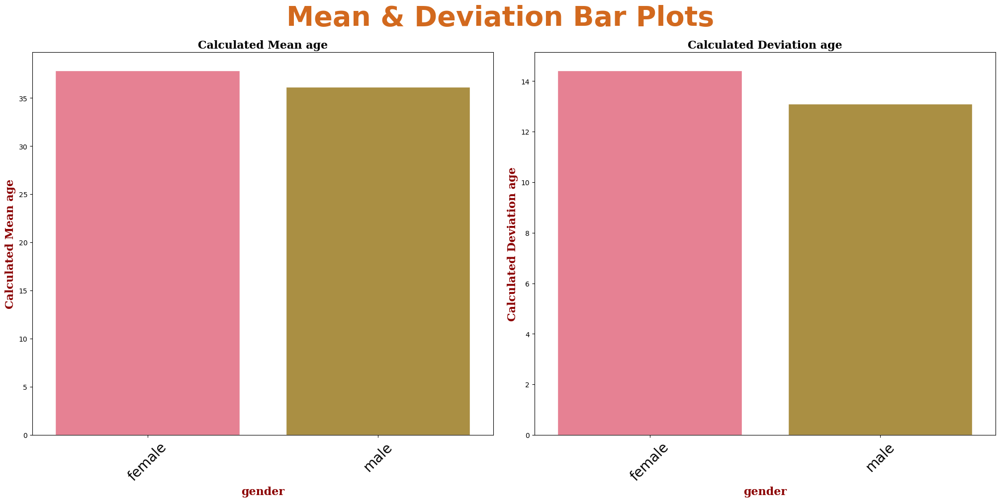

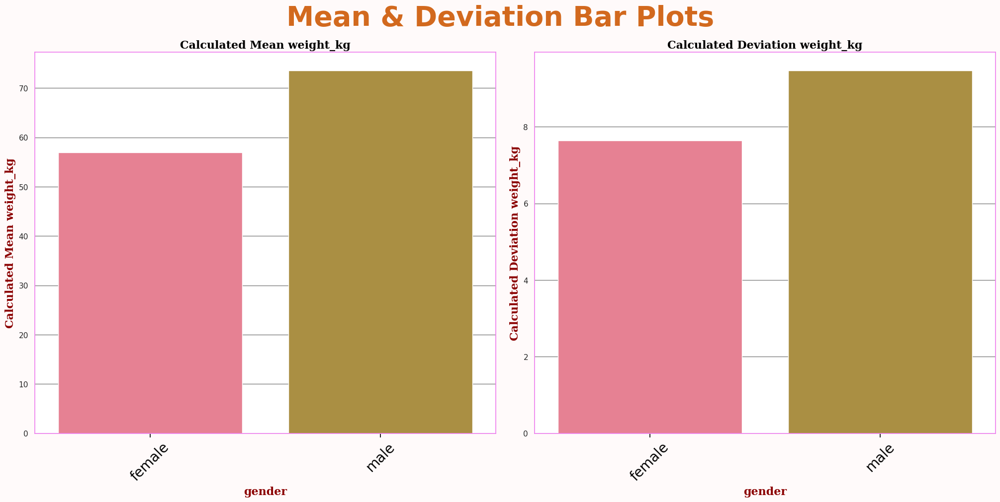

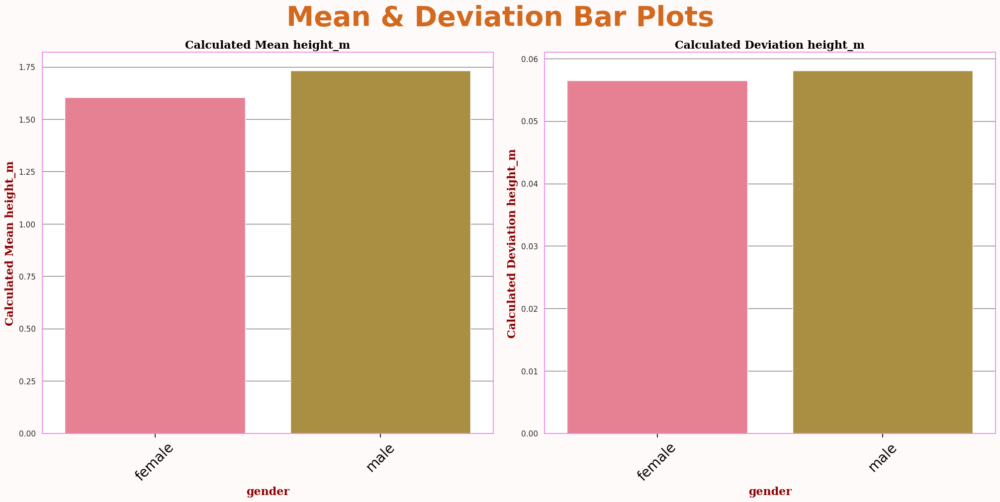

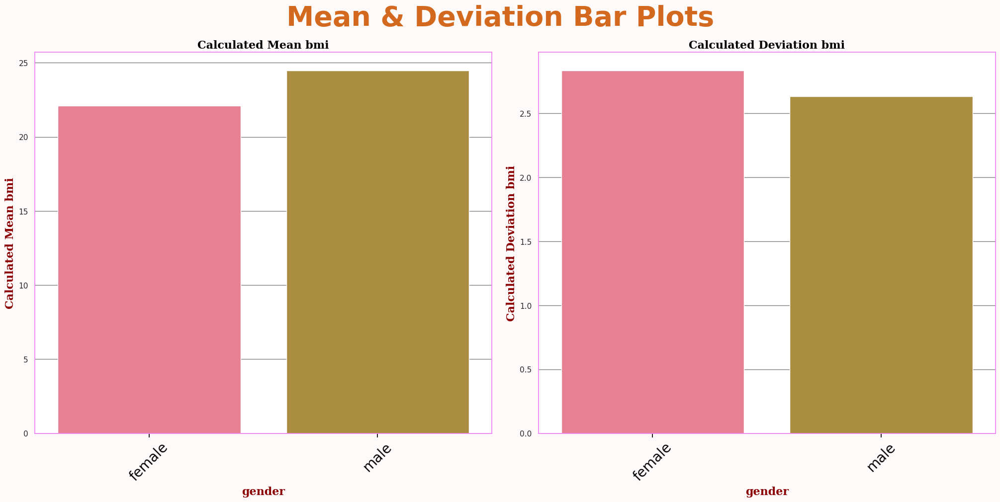

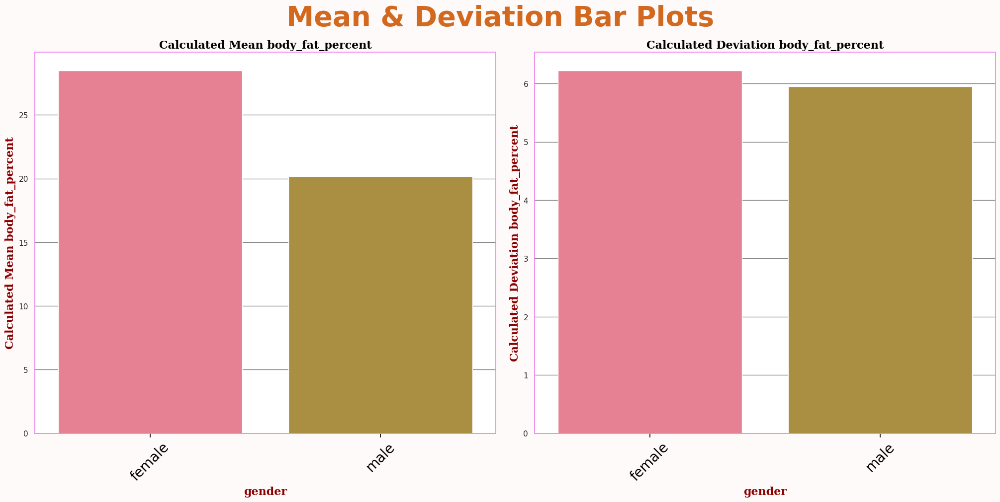

...

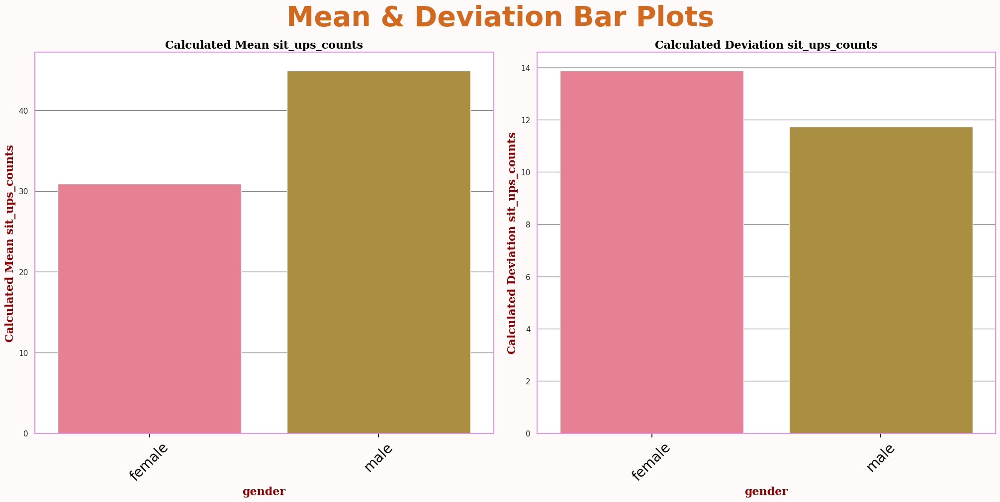

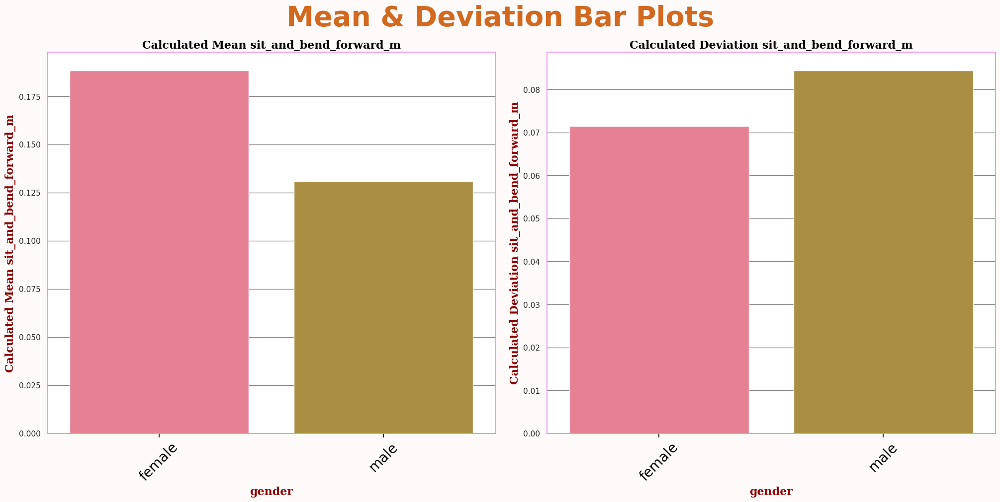

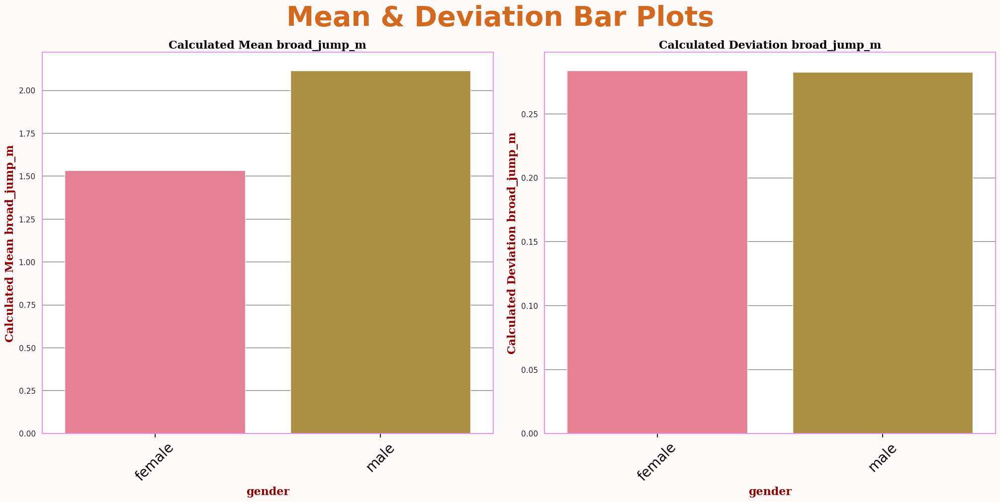

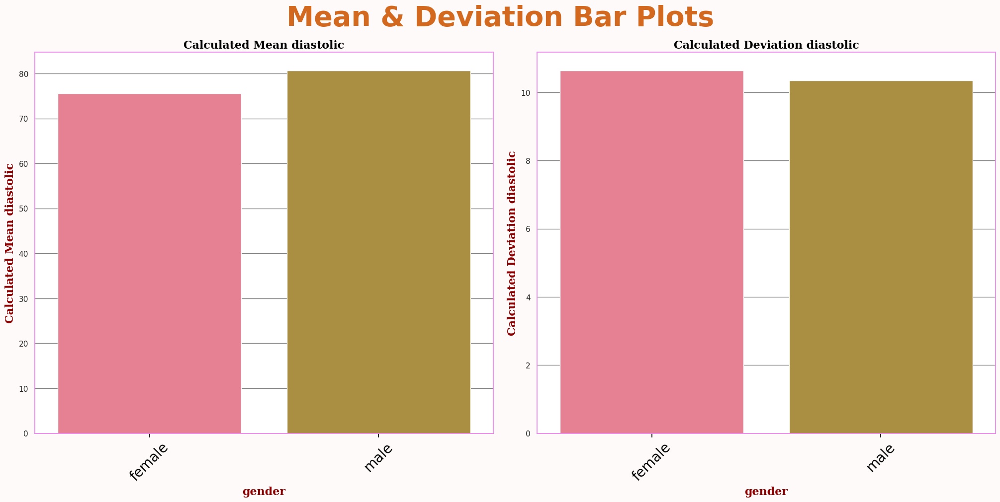

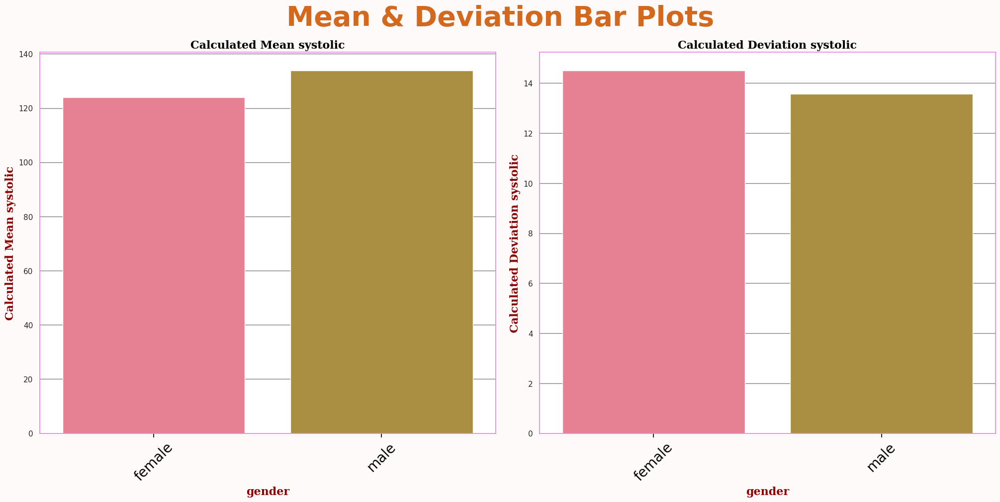

In [65]:
for value in num_list:
    plotting_bar(x=value,group='gender')

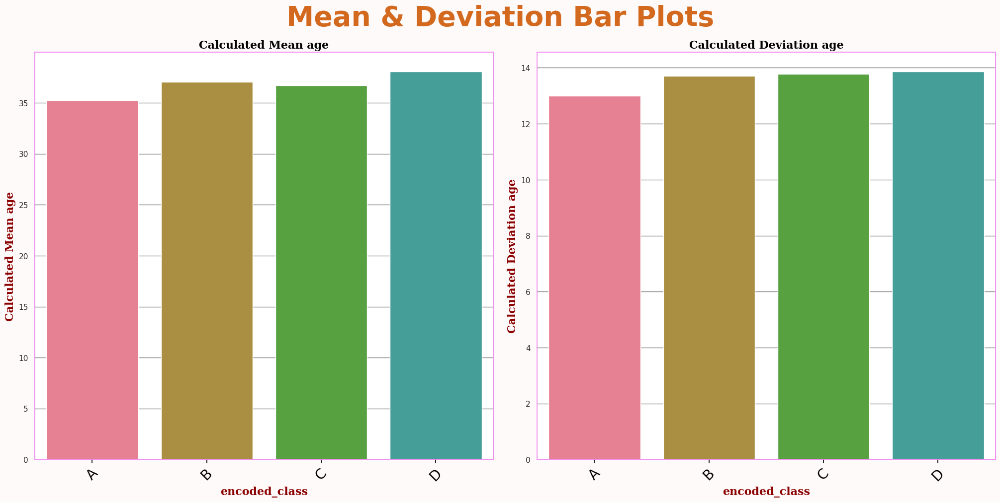

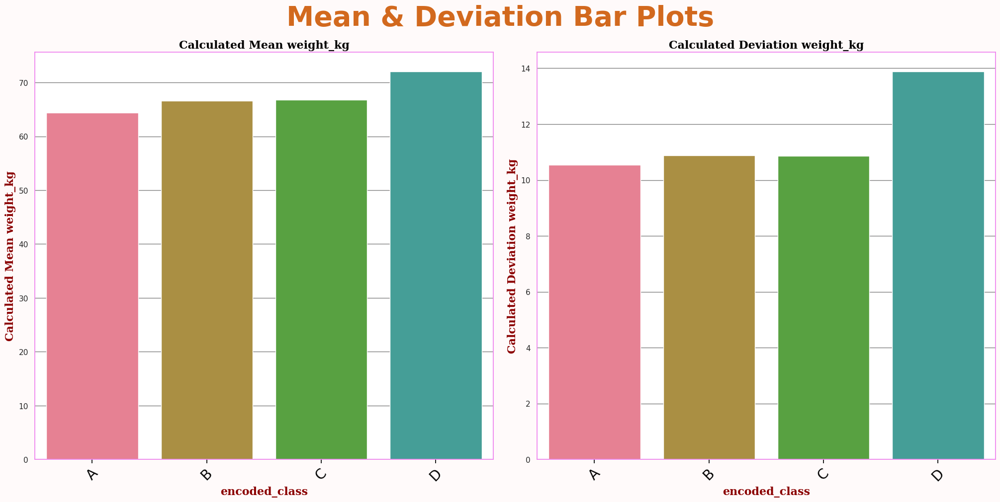

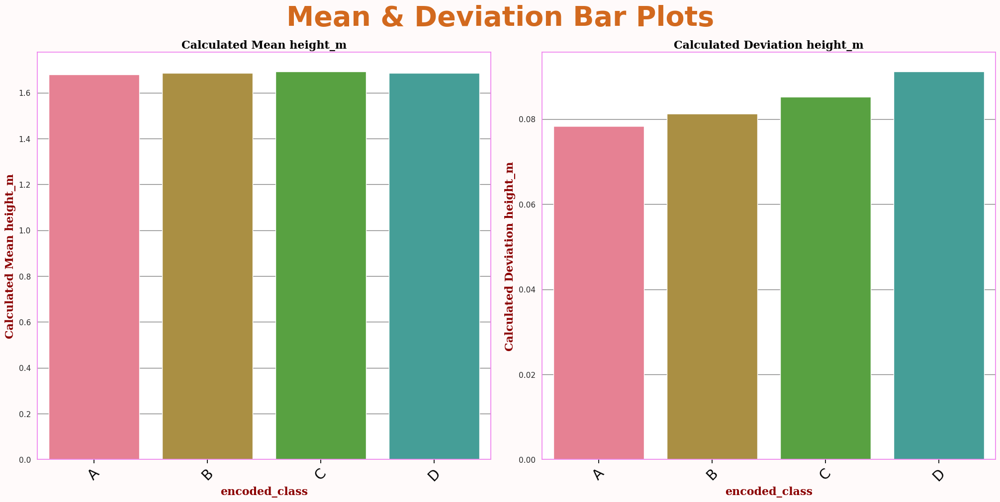

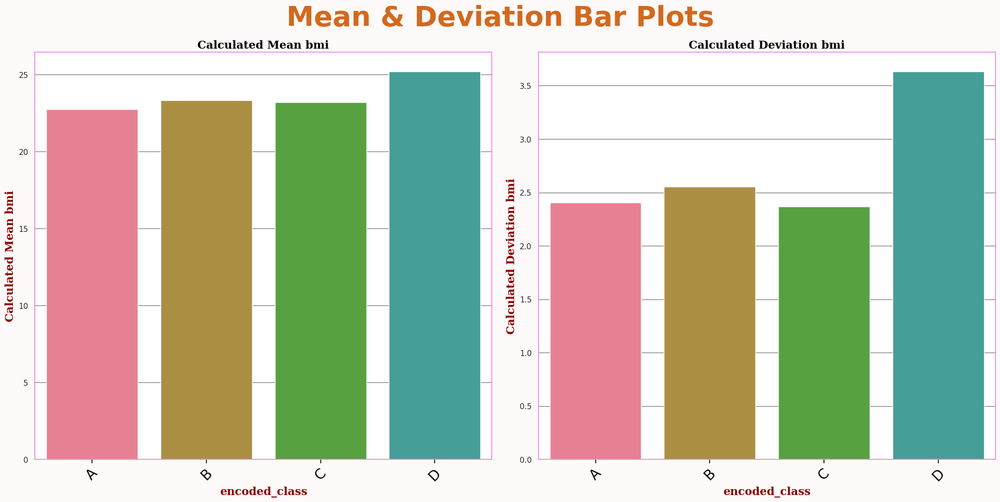

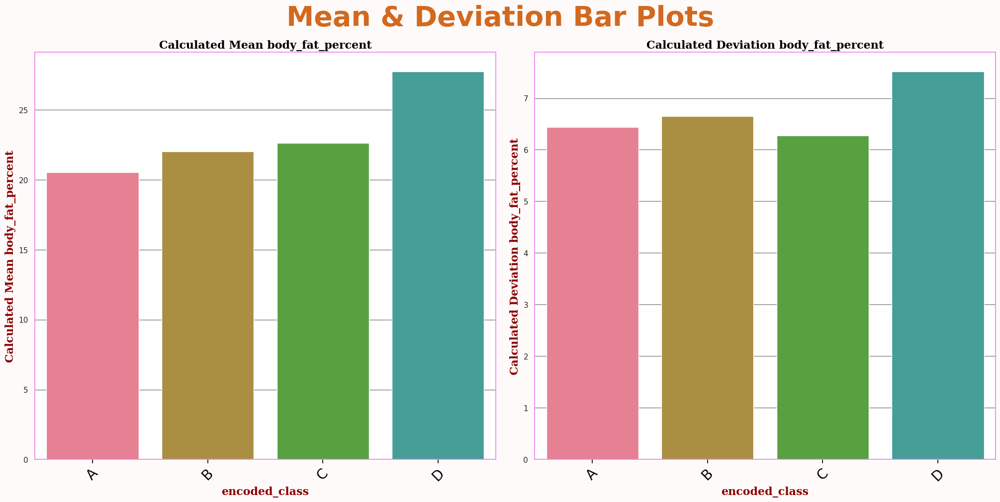

...

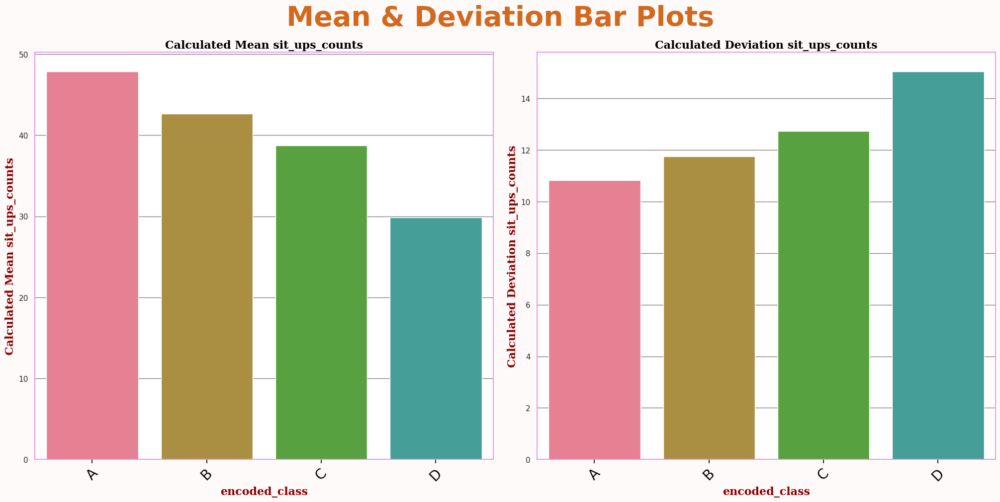

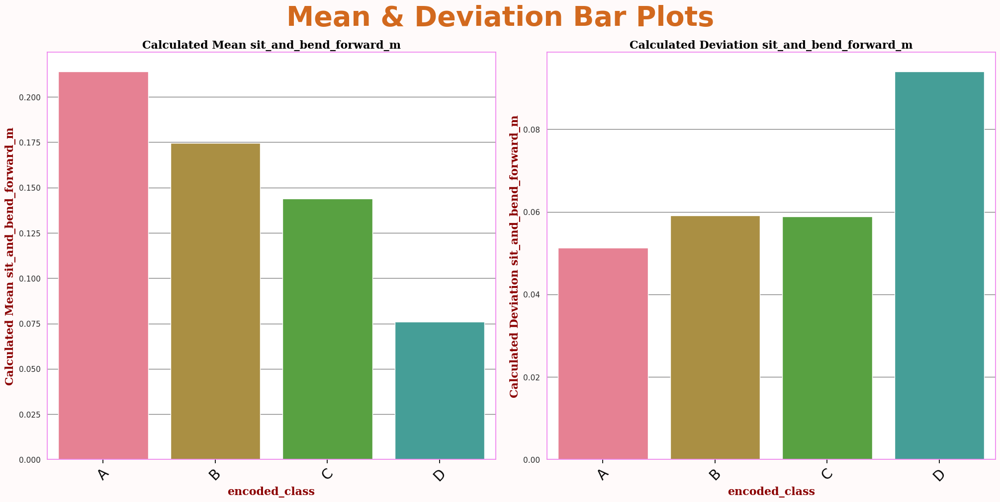

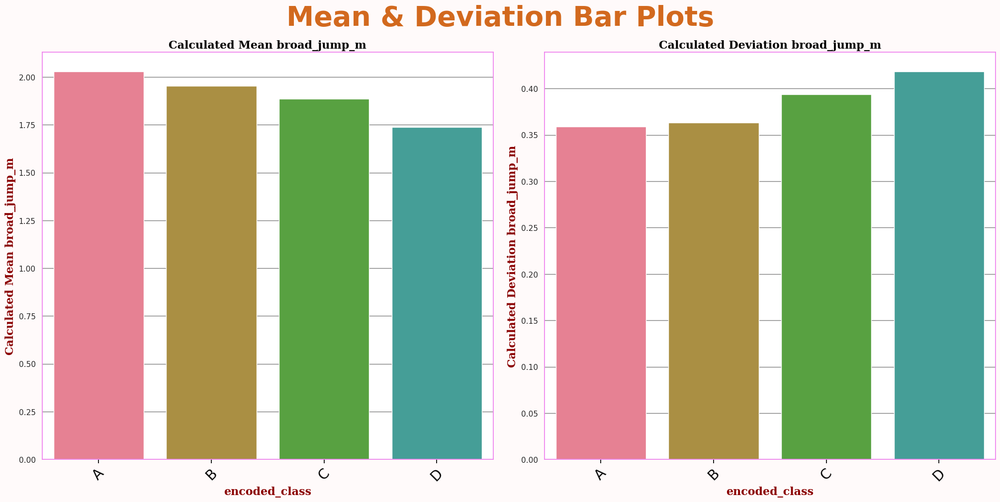

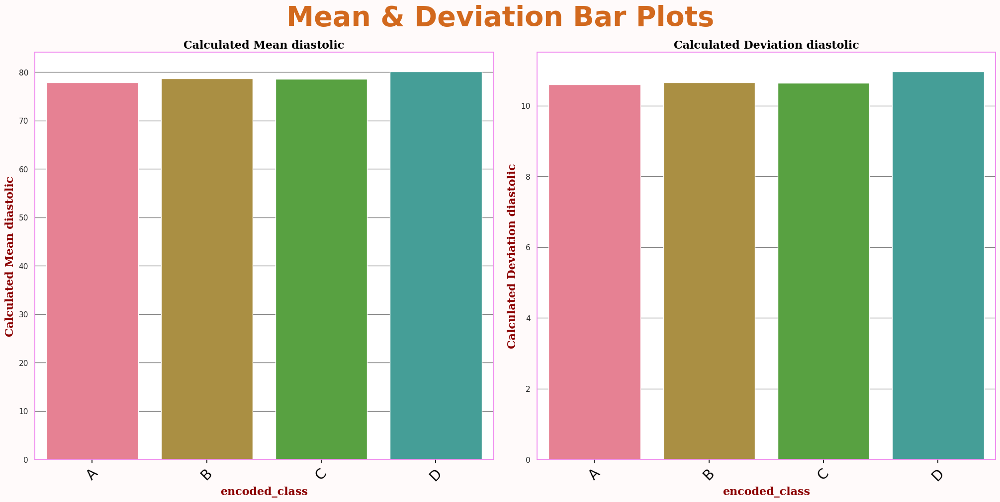

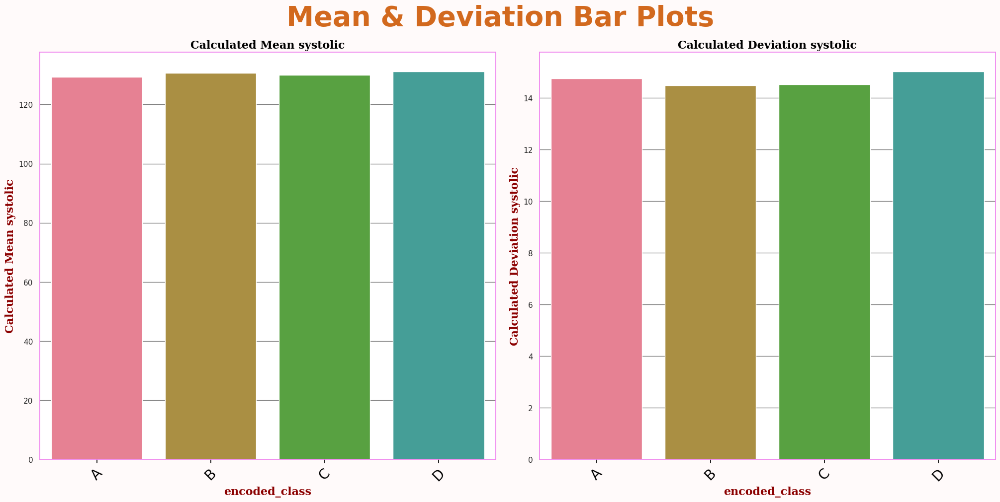

In [66]:
for value in num_list:
    plotting_bar(x=value,group='encoded_class')

In [67]:
def plotting_count(x:str,hue:str):    
    try:
        fig, ax = plt.subplots(figsize=(20,5))
        sns.set_theme(style='whitegrid',rc=rc,palette='bright')

        ordering = eda[x].value_counts()
        # my_palette = sns.color_palette('bright')
        sns.countplot(data=eda, x=x, hue=hue,
        # order=ordering.sort_values().index[::-1], # descending order
        )
        # ax.tick_params(axis='x', rotation=45)
        if x == "gender":
            ax.set_xticklabels(['female','male'],rotation=45,fontsize=20)
            ax.set_title(f'Count plot of number of {x} with {hue}',fontdict=font_title)
            ax.set_xlabel(f"{x}", fontdict=font_label)
            ax.set_ylabel("Count", fontdict=font_label)
        else:
            ax.set_xticklabels(["A","B","C","D"],rotation=45,fontsize=20)
            ax.set_title(f'Count plot of number of {x} with {hue}',fontdict=font_title)
            ax.set_xlabel(f"{x}", fontdict=font_label)
            ax.set_ylabel("Count", fontdict=font_label)

    except ValueError:
            print(f"The wrong Value was passed\nPlease look are the information below\n")
            eda.info(memory_usage='deep')
    except KeyError:
            print(f"The wrong Key was passed\nPlease look are the information below\n")
            eda.info(memory_usage='deep')

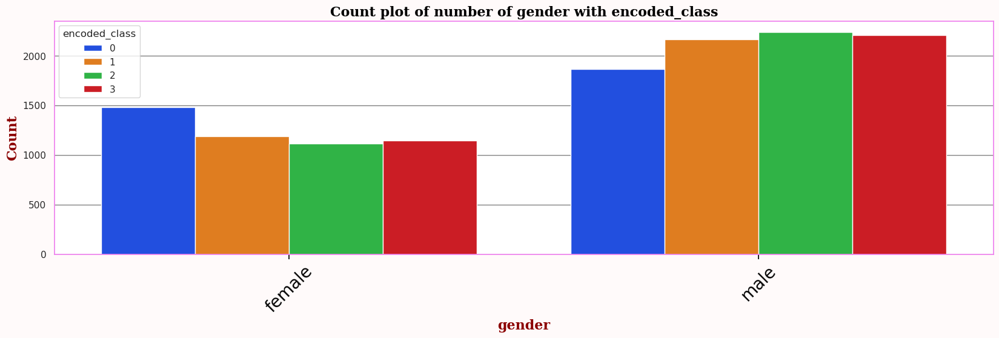

In [68]:
plotting_count('gender','encoded_class')

**Observations**
- Males are more than females in this dataset 
- There are more class C for males and the least class is class A.
- There are more class A for females and the least class is class C.

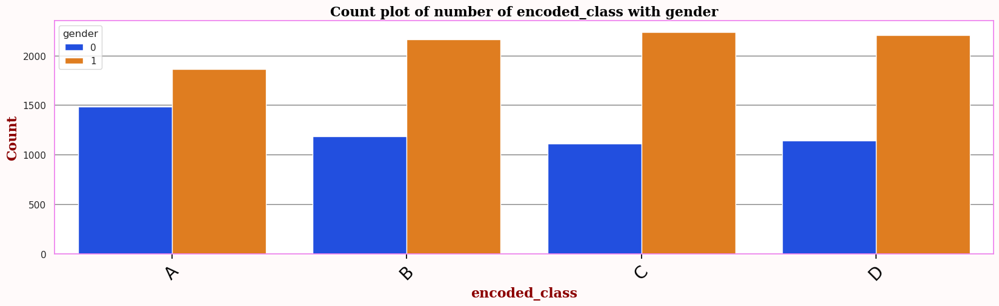

In [69]:
plotting_count('encoded_class','gender')

This graph confirms my previous statements

In [70]:
np.round(eda.skew(),3)

age                       0.600
weight_kg                 0.350
height_m                 -0.187
bmi                       0.574
body_fat_percent          0.361
grip_force                0.018
sit_ups_counts           -0.468
sit_and_bend_forward_m    0.786
broad_jump_m             -0.423
diastolic                -0.160
systolic                 -0.047
dtype: float64

**Skewness**
|Range|Comment|
|---|---|
|skewness is between -0.5 & 0.5|nearly symmetrical.|
|skewness is between -1 & -0.5 (negative skewed) or between 0.5 & 1(positive skewed)|slightly skewed.|
|skewness is lower than -1 (negative skewed) or greater than 1 (positive skewed)|extremely skewed.|

- If the skewness is between -0.5 & 0.5, the data are nearly symmetrical.
- If the skewness is between -1 & -0.5 (negative skewed) or between 0.5 & 1(positive skewed), the data are slightly skewed.
- If the skewness is lower than -1 (negative skewed) or greater than 1 (positive skewed), the data are extremely skewed.

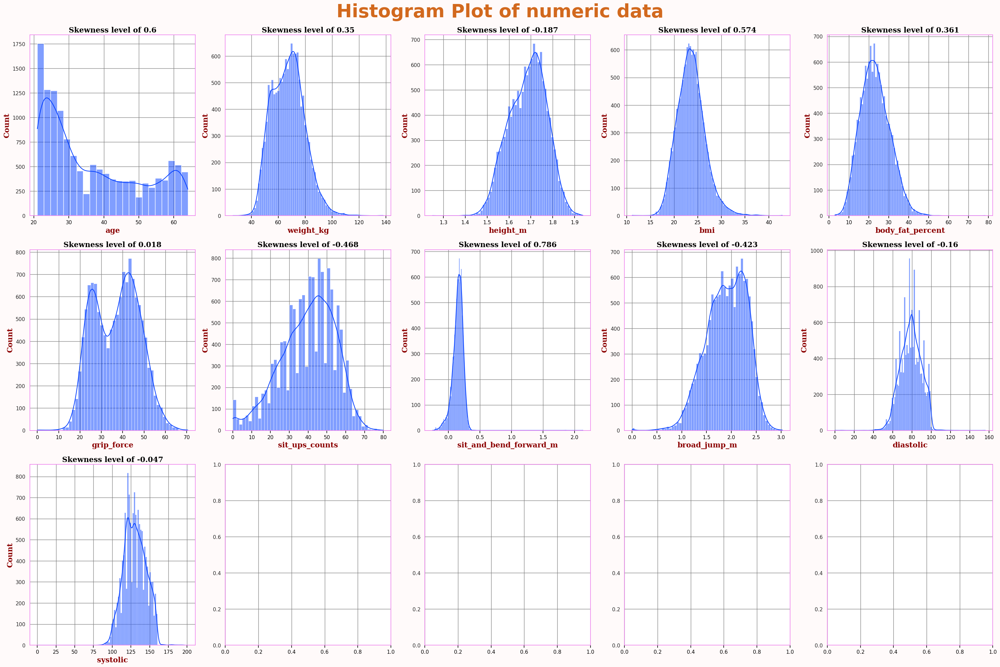

In [71]:
fig,ax = plt.subplots(3,5,constrained_layout=True,figsize=(30,20))
ax = ax.ravel()
sns.set_theme(style='whitegrid',rc=rc,palette='bright')
for index,value in enumerate(num_list):
    sns.histplot(data=eda,x=value,ax=ax[index],kde=True)
    ax[index].set_title(f'Skewness level of {np.around(eda[value].skew(axis=0),3)}',fontdict=font_title)
    ax[index].set_xlabel(f"{value}", fontdict=font_label)
    ax[index].set_ylabel("Count", fontdict=font_label)
    fig.suptitle(f"Histogram Plot of numeric data",fontdict=font_fig,fontsize=40,fontweight='bold')


**Observations**
- Age is slightly skewed
- bmi is slightly skewed
- sit_and_bend_forward_m slightly skewed

Addressing the skewness levels for these columns

In [72]:
cols_treat = ['age','bmi','sit_and_bend_forward_m']

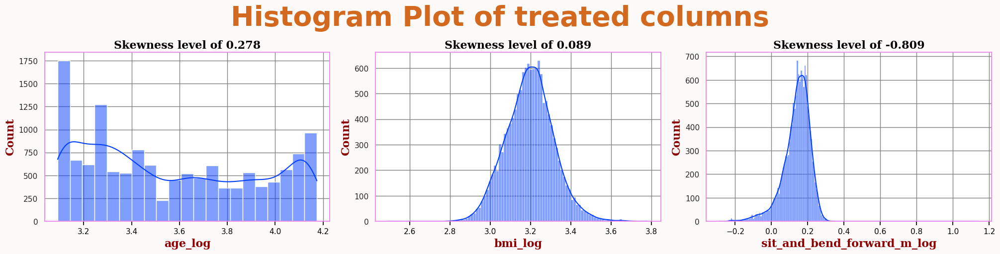

In [79]:
fig,ax = plt.subplots(1,3,constrained_layout=True,figsize=(20,5))
ax = ax.ravel()
sns.set_theme(style='whitegrid',rc=rc,palette='bright')
for index,value in enumerate(cols_treat):
    log = (f"{value}_log")
    # natural log, but has probelms with 0 or negative values
    # eda[log] = eda[value].apply(lambda x: np.log(x)) 
    # addresses the above issue
    # eda[log] = eda[value].apply(lambda x: np.log(x+1))
    # Numpy's inbuilt function for the above 
    eda[log] = eda[value].apply(lambda x: np.log1p(x))
    sns.histplot(data=eda,x=log,ax=ax[index],kde=True)
    ax[index].set_title(f'Skewness level of {np.around(eda[log].skew(axis=0),3)}',fontdict=font_title)
    ax[index].set_xlabel(f"{log}", fontdict=font_label)
    ax[index].set_ylabel("Count", fontdict=font_label)
    fig.suptitle(f"Histogram Plot of treated columns",fontdict=font_fig,fontsize=40,fontweight='bold')


**Observations**
- age skewness changed improved from 0.6 to 0.278; will use the log ?
- bmi skewness changed improved from 0.574 to 0.089; will use the log ?
- sit_and_bend_forward_m skewness doesn't show much improvements from 0.786 to -0.809; ; will not use the log

In [80]:
print(eda.columns)

Index(['age', 'weight_kg', 'height_m', 'bmi', 'body_fat_percent', 'grip_force',
       'sit_ups_counts', 'sit_and_bend_forward_m', 'broad_jump_m', 'diastolic',
       'systolic', 'gender', 'encoded_class', 'age_log', 'bmi_log',
       'sit_and_bend_forward_m_log'],
      dtype='object')


In [81]:
print(eda.columns)

Index(['age', 'weight_kg', 'height_m', 'bmi', 'body_fat_percent', 'grip_force',
       'sit_ups_counts', 'sit_and_bend_forward_m', 'broad_jump_m', 'diastolic',
       'systolic', 'gender', 'encoded_class', 'age_log', 'bmi_log',
       'sit_and_bend_forward_m_log'],
      dtype='object')


In [82]:
objects = eda.select_dtypes(include=pd.CategoricalDtype).columns.to_list()
objects

['gender', 'encoded_class']

In [83]:
def box_plot(x:str):
    try:
        fig,ax = plt.subplots(2, figsize=(30,20))
        sns.set_theme(style='whitegrid',rc=rc,palette='bright')
        ax = ax.ravel()

        for index,value in enumerate(objects):
            sns.boxplot(data=eda,y=value,x=x,hue=value,ax=ax[index])
            ax[index].set_title(f'Box plot of {x}',fontdict=font_title)
            ax[index].set_xlabel(f"{x}", fontdict=font_label)
            ax[index].set_ylabel(f"{value}", fontdict=font_label)
            fig.suptitle("Box plots",fontdict=font_fig,fontsize=40,fontweight='bold')
    except ValueError:
            print(f"The wrong Value was passed\nPlease look are the information below\n")
            eda.info(memory_usage='deep')
    except KeyError:
            print(f"The wrong Key was passed\nPlease look are the information below\n")
            eda.info(memory_usage='deep')

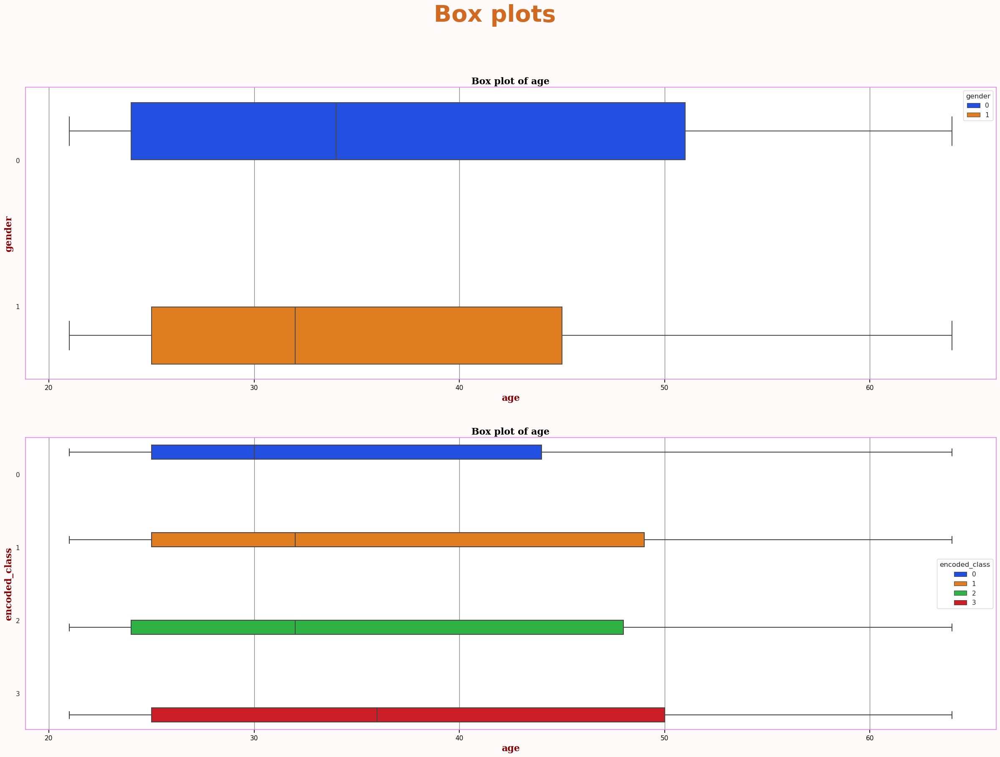

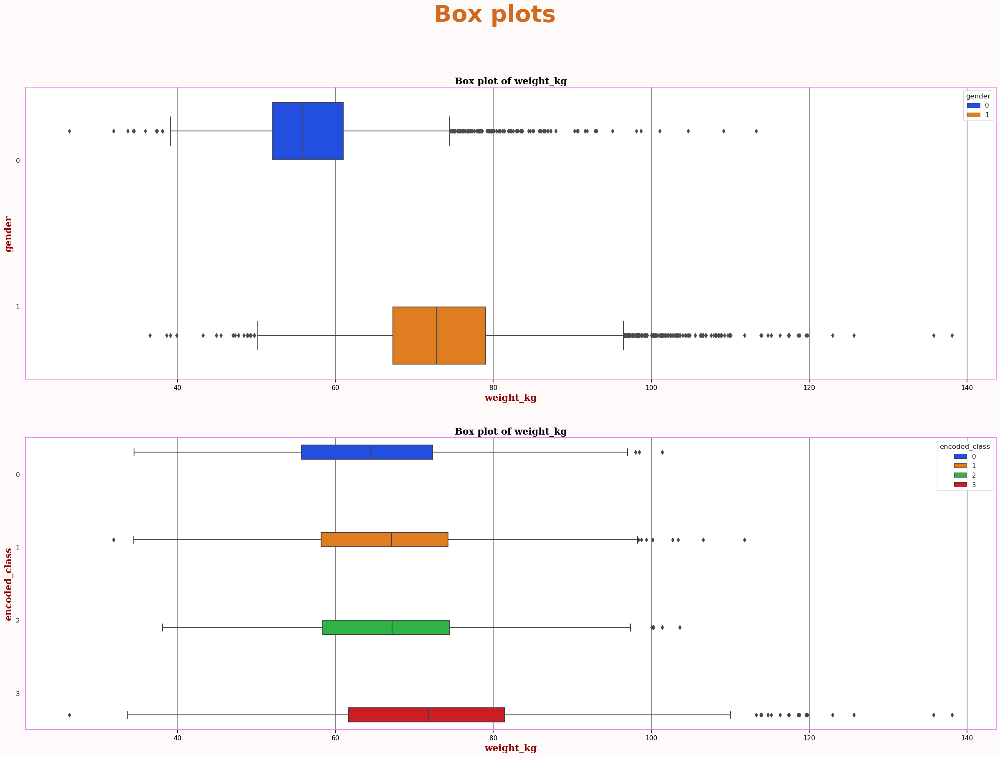

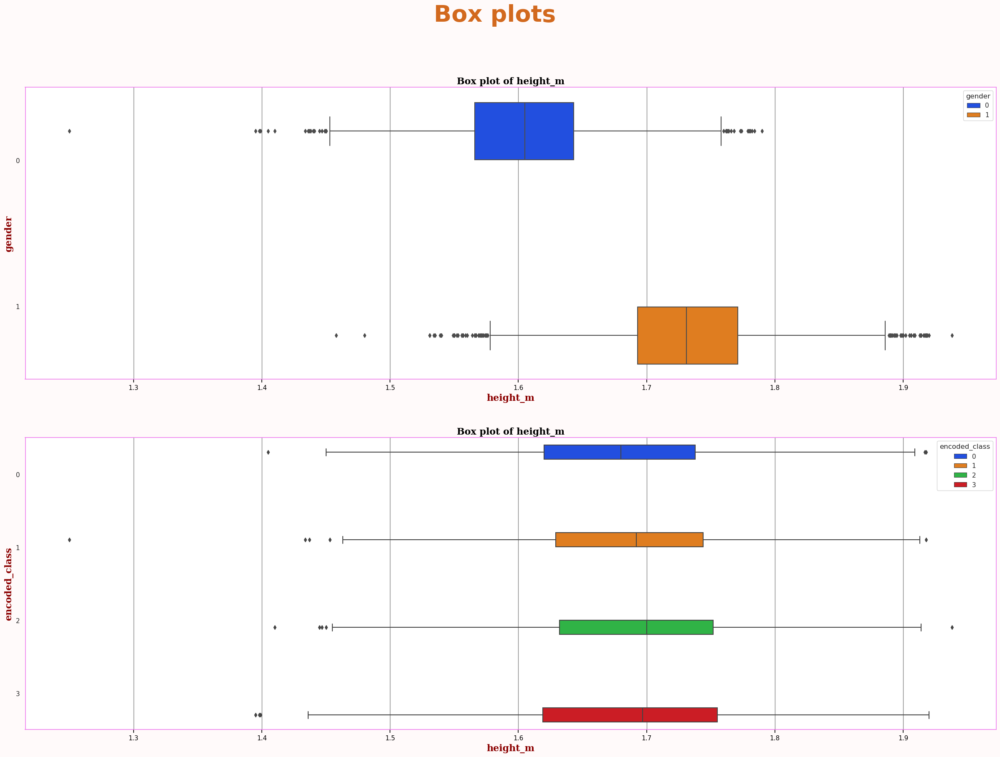

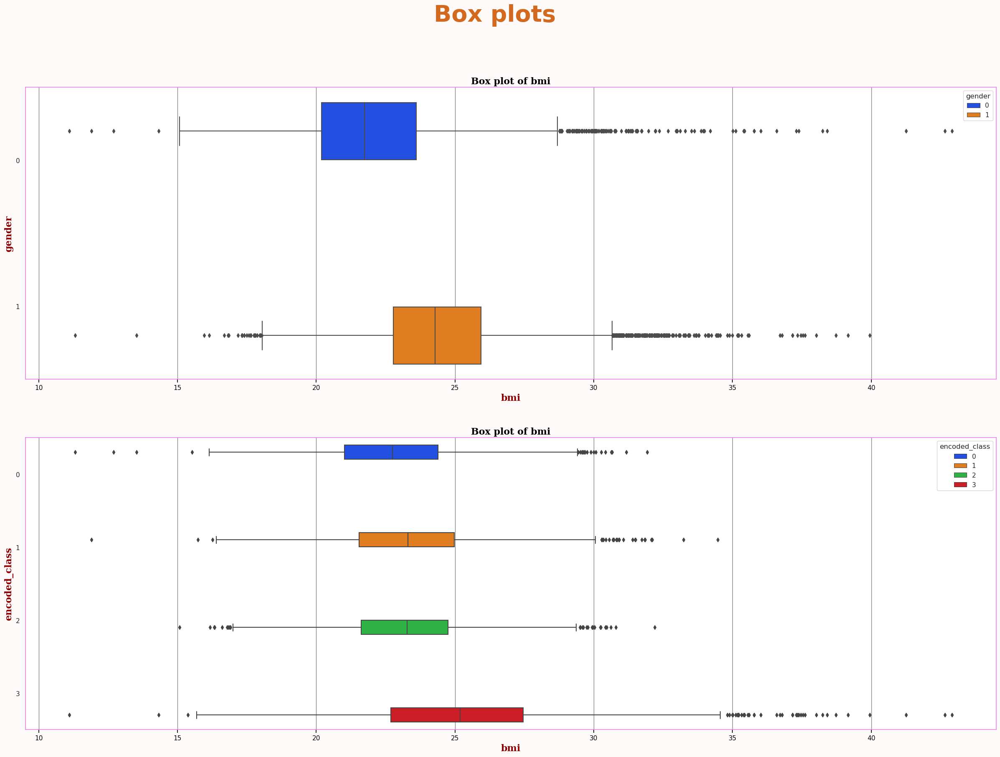

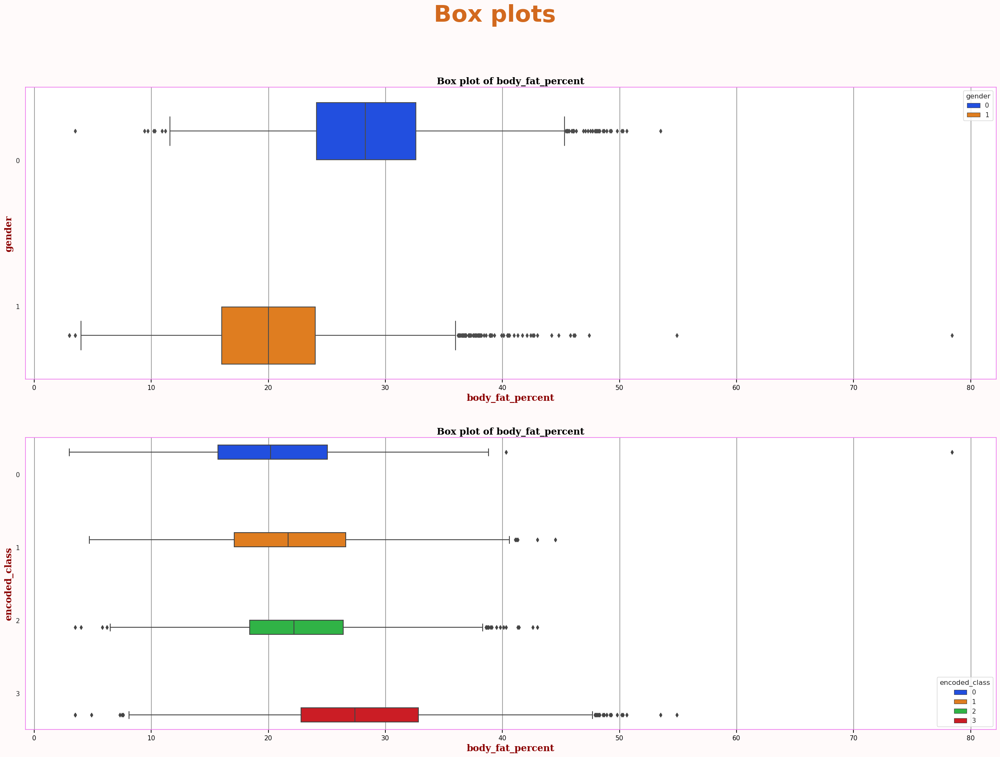

...

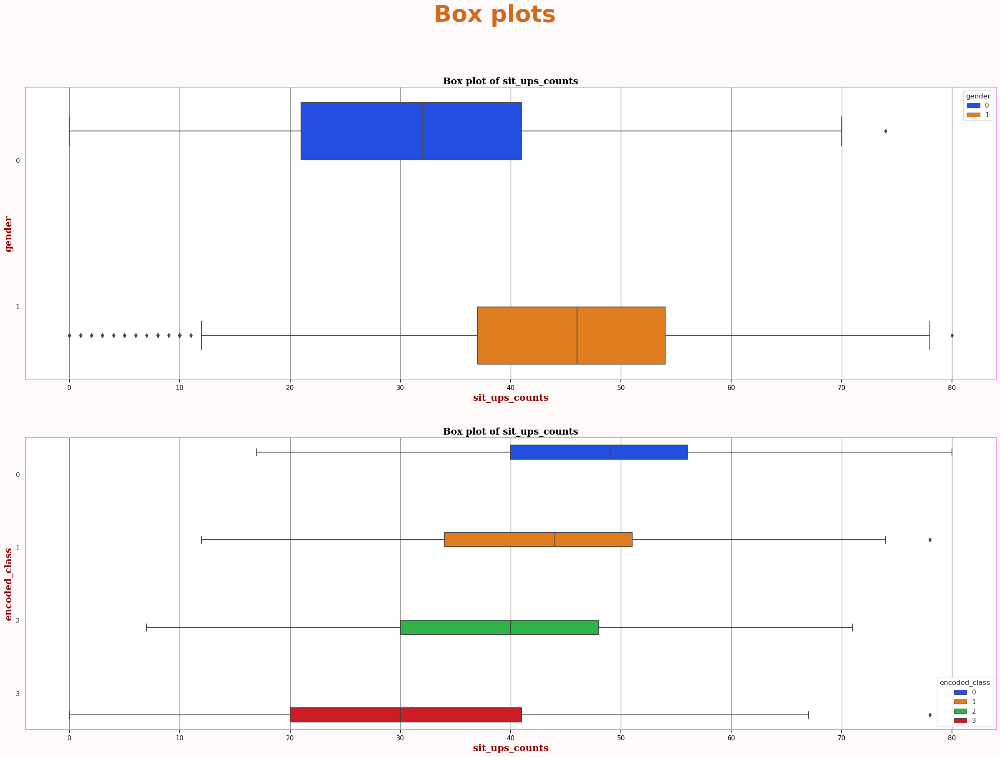

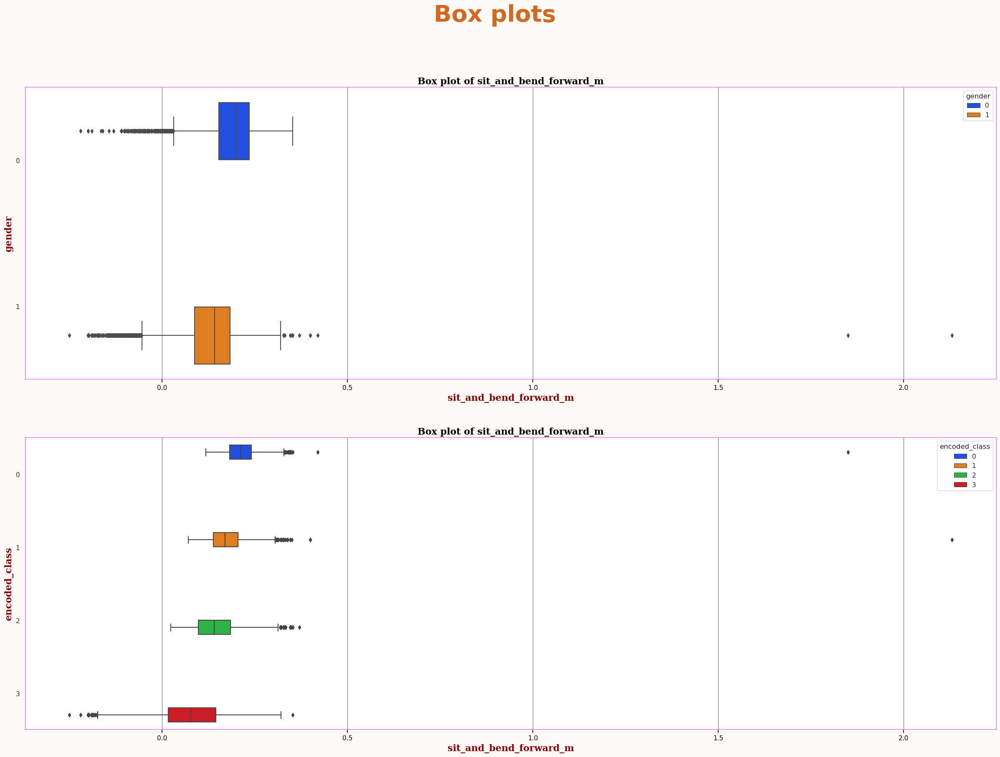

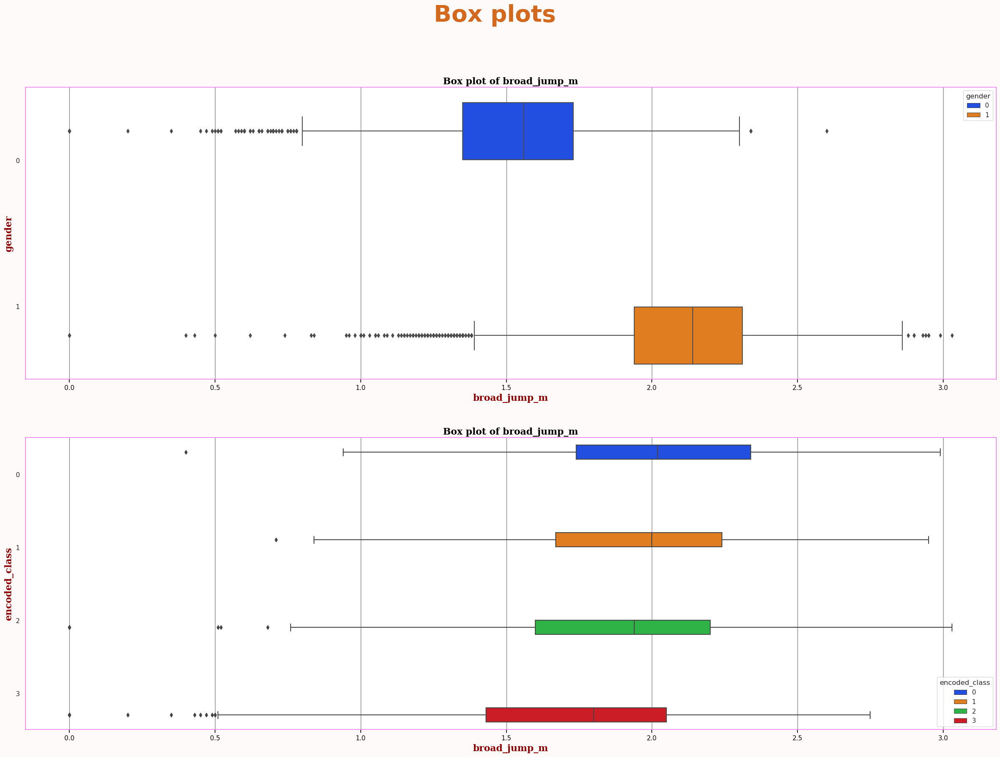

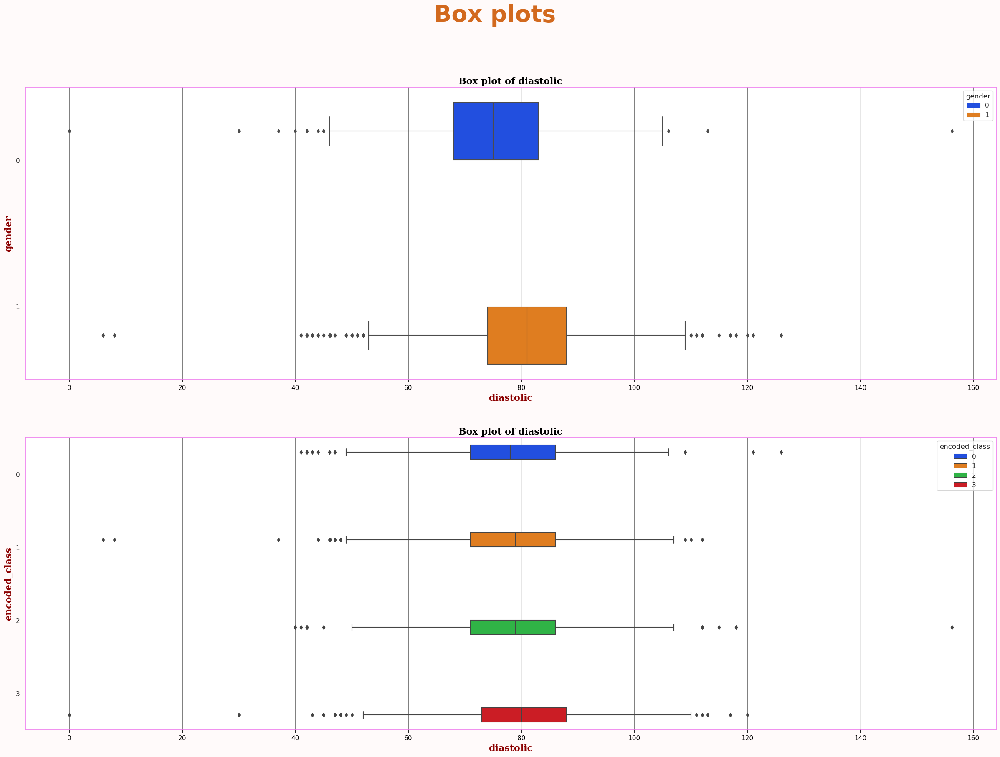

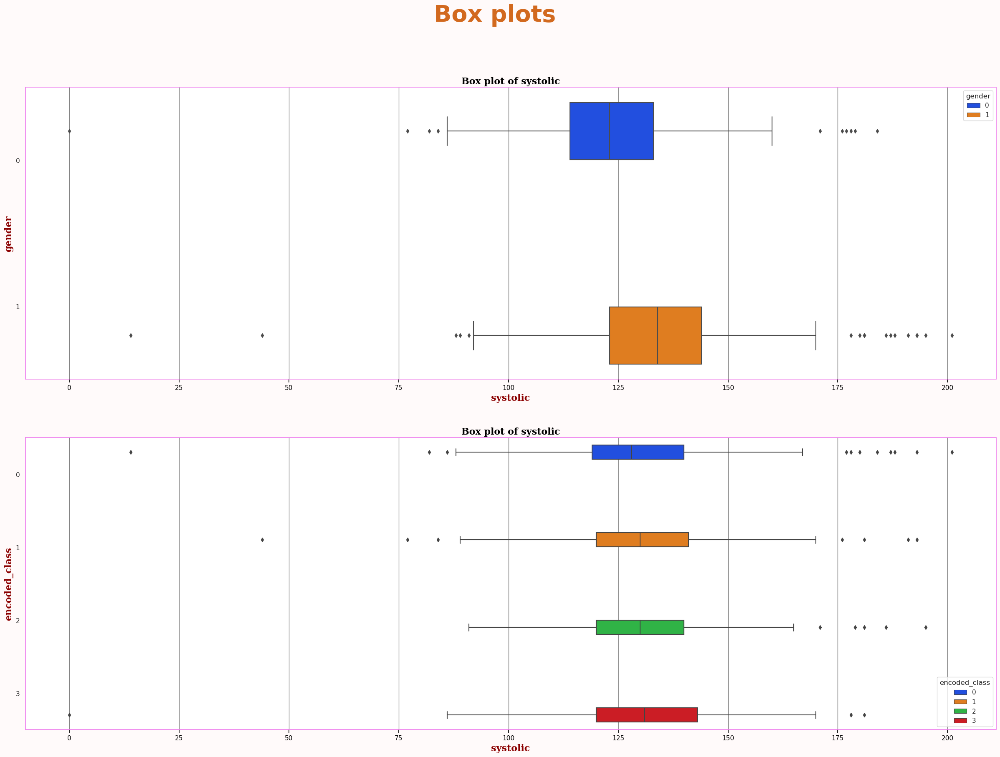

In [84]:
for num in num_list:
    box_plot(num)

**Observations**
- Males have a higher tendancy of having a weight above 100kg
- Class D has a higher tendancy of being over 100kg
- Males have a a greater chance of being tall.
- Class C seems to have a male which is the tallest.
- Females have a greater bmi index; over 40kg/m2 than males.
- Class D has a bmi index over 35kg/m2.
- Males has an individual whose body_fat percentage is over 70%
- Class A has the male individual above 70%
- Males have a greater grip force than females
- Class A has a greater grip force than other classes; over 70,but class D as an outlier above 70.
- Males have a higher sit_up count than females; over 70 but females have an outlier over 70.
- Class A has the highest sit_up count then B, C and D, with the exemption of outliers.
- Males has outliers which are sit_and_bend_forward over 2m.
- Class C adn B supposedly contains the male whose sit_and_bend_forward over 1.5m.
- Males have a higher broad_jump than females
- Class C has a the male individual whose borad jump is above 3m.
- Females have an individual whose diastolic pressure is above 140
- Class C has that female individual
- Males has an individual whose systolic value is above 200
- Class A has that individual.

In [85]:
# cond = ((eda.gender == 1) & (eda.weight_kg >=120) )
cond = (eda.weight_kg >=100)
eda[cond].head(10)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class,age_log,bmi_log,sit_and_bend_forward_m_log
58,42,103.1,1.741,34.014268,30.5,50.7,25.0,0.036,1.53,78.0,123.0,1,3,3.761200,3.555756,0.035367
231,26,103.4,1.802,31.842779,24.7,67.6,46.0,0.162,2.19,70.0,128.0,1,1,3.295837,3.491732,0.150143
303,30,108.9,1.852,31.750160,23.1,54.0,52.0,0.277,2.31,98.0,143.0,1,3,3.433987,3.488908,0.244514
359,43,104.9,1.746,34.410185,36.2,32.7,22.0,-0.013,1.73,97.0,150.0,1,3,3.784190,3.566999,-0.013085
419,21,103.6,1.751,33.789943,39.1,28.8,20.0,-0.143,1.19,89.0,147.0,1,3,3.091042,3.549328,-0.154317
515,33,117.5,1.868,33.673179,28.3,64.9,49.0,0.193,2.13,78.0,133.0,1,3,3.526361,3.545966,0.176471
554,35,125.7,1.916,34.240829,35.2,58.0,52.0,0.092,2.28,85.0,156.0,1,3,3.583519,3.562205,0.088011
786,22,101.3,1.870,28.968515,26.3,47.0,56.0,0.086,2.42,75.0,133.0,1,3,3.135494,3.400147,0.082501
814,33,108.3,1.845,31.815278,30.2,58.7,50.0,0.167,2.24,87.0,152.0,1,3,3.526361,3.490894,0.154436
875,58,100.4,1.686,35.319827,30.3,43.1,37.0,0.001,1.71,82.0,141.0,1,3,4.077537,3.592364,0.001000


In [86]:
cond = eda.height_m> 1.8
eda[cond].head(10)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class,age_log,bmi_log,sit_and_bend_forward_m_log
9,28,84.60,1.850,24.718773,14.4,57.9,55.0,0.121,2.13,81.0,156.0,1,1,3.367296,3.247221,0.114221
14,24,84.40,1.810,25.762339,20.4,48.9,54.0,0.072,2.13,80.0,120.0,1,2,3.218876,3.286996,0.069526
46,34,76.82,1.836,22.789193,16.3,46.3,55.0,0.142,2.20,80.0,120.0,1,1,3.555348,3.169231,0.132781
48,28,82.10,1.801,25.311375,15.0,52.6,55.0,0.188,2.47,83.0,147.0,1,0,3.367296,3.270001,0.172271
51,23,65.90,1.801,20.316926,14.4,45.4,56.0,0.181,2.34,72.0,130.0,1,0,3.178054,3.059501,0.166362
59,45,80.00,1.854,23.273973,21.9,46.2,22.0,0.071,2.05,93.0,144.0,1,3,3.828641,3.189405,0.068593
100,44,79.50,1.805,24.401286,21.7,42.3,33.0,0.108,1.96,87.0,127.0,1,2,3.806662,3.234800,0.102557
113,35,84.18,1.847,24.676021,16.3,48.8,56.0,0.153,2.29,70.0,120.0,1,0,3.583519,3.245558,0.142367
118,22,76.90,1.835,22.837797,15.7,40.9,56.0,0.228,2.53,86.0,143.0,1,0,3.135494,3.171272,0.205387
127,28,84.60,1.848,24.772306,17.2,52.5,56.0,0.117,2.57,83.0,123.0,1,1,3.367296,3.249300,0.110647


In [87]:
cond = eda.bmi>=40
eda[cond].head(10)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class,age_log,bmi_log,sit_and_bend_forward_m_log
1400,30,113.3,1.625,42.906509,53.5,24.4,12.0,0.030,1.00,82.0,135.0,0,3,3.433987,3.782063,0.029559
9178,48,109.2,1.600,42.656250,50.6,36.9,0.0,0.082,1.59,94.0,141.0,0,3,3.891820,3.776346,0.078811
12884,40,90.6,1.482,41.250744,48.3,22.0,4.0,0.002,1.10,65.0,119.0,0,3,3.713572,3.743622,0.001998


In [88]:
cond = eda.body_fat_percent>=70
eda[cond].head()

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class,age_log,bmi_log,sit_and_bend_forward_m_log
735,21,74.5,1.776,23.619481,78.4,44.9,59.0,0.261,2.35,69.0,122.0,1,0,3.091042,3.203538,0.231905


In [89]:
cond = eda.grip_force >=70
eda[cond].head(10)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class,age_log,bmi_log,sit_and_bend_forward_m_log
1736,29,95.4,1.764,30.658522,21.1,70.5,56.0,0.194,2.20,85.0,142.0,1,0,3.401197,3.455007,0.177309
5113,31,92.5,1.870,26.452000,19.8,70.4,61.0,-0.060,2.45,79.0,138.0,1,3,3.465736,3.312439,-0.061875


In [90]:
cond = eda.sit_ups_counts >=70
eda[cond].head(10)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class,age_log,bmi_log,sit_and_bend_forward_m_log
603,21,92.5,1.864,26.622566,11.2,47.0,71.0,0.249,2.55,75.0,124.0,1,2,3.091042,3.318633,0.222343
1191,29,79.0,1.747,25.884589,19.0,45.7,74.0,0.172,2.41,75.0,140.0,1,0,3.401197,3.291553,0.158712
1217,27,66.5,1.683,23.477585,13.9,47.9,70.0,0.118,2.31,59.0,115.0,1,1,3.332205,3.197758,0.111541
1314,29,83.8,1.750,27.363265,17.2,57.6,78.0,0.147,2.54,77.0,122.0,1,3,3.401197,3.345095,0.137150
1911,28,59.7,1.779,18.863507,13.1,40.9,70.0,0.230,2.47,90.0,143.0,1,0,3.367296,2.988884,0.207014
2135,21,64.0,1.705,22.015635,13.2,48.1,73.0,0.198,2.90,78.0,138.0,1,0,3.091042,3.136174,0.180653
2223,33,79.9,1.749,26.119638,20.7,52.1,76.0,0.162,2.44,71.0,130.0,1,0,3.526361,3.300258,0.150143
2267,32,74.7,1.730,24.959070,12.0,53.8,76.0,0.230,2.74,84.0,122.0,1,0,3.496508,3.256521,0.207014
2332,28,51.9,1.580,20.789938,26.3,24.1,70.0,0.309,1.91,90.0,135.0,0,0,3.367296,3.081448,0.269263
2336,25,71.7,1.649,26.368040,20.6,40.1,70.0,0.187,2.23,83.0,138.0,1,1,3.258097,3.309376,0.171429


In [91]:
cond = eda.sit_and_bend_forward_m >=2
eda[cond].head(10)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class,age_log,bmi_log,sit_and_bend_forward_m_log
2657,33,60.4,1.656,22.025018,17.8,38.6,53.0,2.13,2.44,81.0,127.0,1,1,3.526361,3.136581,1.141033


In [92]:
cond = eda.broad_jump_m >= 1.5
eda[cond].head(10)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class,age_log,bmi_log,sit_and_bend_forward_m_log
0,27,75.24,1.723,25.344179,21.3,54.9,60.0,0.184,2.17,80.0,130.0,1,2,3.332205,3.271247,0.168899
1,25,55.80,1.650,20.495868,15.7,36.4,53.0,0.163,2.29,77.0,126.0,1,0,3.258097,3.067861,0.151003
2,31,78.00,1.796,24.181428,20.1,44.8,49.0,0.120,1.81,92.0,152.0,1,2,3.465736,3.226107,0.113329
3,32,71.10,1.745,23.349562,18.4,41.4,53.0,0.152,2.19,76.0,147.0,1,1,3.496508,3.192514,0.141500
4,28,67.70,1.738,22.412439,17.1,43.5,45.0,0.271,2.17,70.0,127.0,1,1,3.367296,3.153267,0.239804
5,36,55.40,1.654,20.250640,22.0,23.8,27.0,0.210,1.53,64.0,119.0,0,1,3.610918,3.056387,0.190620
7,33,77.20,1.749,25.236997,36.9,45.9,42.0,0.123,2.34,84.0,137.0,1,1,3.526361,3.267171,0.116004
9,28,84.60,1.850,24.718773,14.4,57.9,55.0,0.121,2.13,81.0,156.0,1,1,3.367296,3.247221,0.114221
10,42,65.40,1.692,22.844257,19.3,43.5,68.0,0.160,2.11,63.0,110.0,1,0,3.761200,3.171543,0.148420
13,22,67.90,1.757,21.995116,11.3,52.5,55.0,0.192,2.32,71.0,103.0,1,2,3.135494,3.135282,0.175633


In [93]:
# males
cond = ((eda.diastolic > 70) & 
        ((eda.systolic>119 ) & (eda.systolic<140)))
cond2 = eda.gender ==1
cond3 = (cond & cond2)
eda[cond3].sort_values(by='diastolic').head(10)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class,age_log,bmi_log,sit_and_bend_forward_m_log
3214,23,89.1,1.819,26.928509,13.5,51.6,49.0,0.177,2.50,71.0,130.0,1,1,3.178054,3.329648,0.162969
12503,27,64.5,1.692,22.529886,12.3,47.0,49.0,0.174,2.41,71.0,125.0,1,1,3.332205,3.158271,0.160417
12468,55,67.3,1.696,23.397172,21.6,35.0,32.0,0.175,1.83,71.0,127.0,1,2,4.025352,3.194467,0.161268
1004,31,89.9,1.834,26.727666,20.6,66.0,53.0,0.210,2.35,71.0,138.0,1,1,3.465736,3.322431,0.190620
8321,21,64.1,1.700,22.179931,18.9,49.0,53.0,0.218,2.50,71.0,120.0,1,1,3.091042,3.143287,0.197210
12361,31,68.7,1.850,20.073046,13.3,36.4,53.0,0.107,2.44,71.0,125.0,1,1,3.465736,3.047995,0.101654
12334,39,65.1,1.787,20.385994,18.2,48.3,39.0,0.157,2.08,71.0,120.0,1,2,3.688879,3.062736,0.145830
12311,46,69.9,1.764,22.463634,18.1,42.3,46.0,0.254,2.14,71.0,121.0,1,1,3.850148,3.155452,0.226338
4778,24,73.5,1.761,23.701107,22.0,48.4,61.0,0.239,2.19,71.0,126.0,1,0,3.218876,3.206848,0.214305
8537,26,66.1,1.717,22.421304,15.0,43.2,54.0,0.074,2.42,71.0,123.0,1,2,3.295837,3.153646,0.071390


In [94]:
eda[cond3].sort_values(by='diastolic').tail(10)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class,age_log,bmi_log,sit_and_bend_forward_m_log
12621,41,85.10,1.787,26.648972,31.5,46.0,50.0,0.100,2.24,99.0,138.0,1,3,3.737670,3.319589,0.095310
12596,30,69.64,1.686,24.498733,21.9,43.7,59.0,0.209,2.42,99.0,137.0,1,0,3.433987,3.238629,0.189794
9674,53,60.50,1.663,21.876149,21.1,39.0,34.0,0.185,2.02,99.0,138.0,1,2,3.988984,3.130095,0.169743
9709,22,59.80,1.743,19.683685,14.0,37.1,48.0,-0.065,1.93,99.0,128.0,1,3,3.135494,3.029345,-0.067209
11402,48,80.10,1.741,26.426216,19.6,49.4,48.0,0.194,2.04,99.0,134.0,1,2,3.891820,3.311499,0.177309
3358,47,75.40,1.730,25.192957,24.5,43.4,32.0,0.167,1.93,99.0,135.0,1,2,3.871201,3.265491,0.154436
9461,41,86.40,1.736,28.669116,24.5,62.0,43.0,0.232,2.41,100.0,135.0,1,1,3.737670,3.390107,0.208639
1361,27,61.50,1.676,21.894099,20.5,38.5,57.0,0.127,2.06,100.0,138.0,1,2,3.332205,3.130879,0.119559
3854,35,71.90,1.684,25.353897,19.1,53.6,42.0,0.162,2.32,109.0,138.0,1,1,3.583519,3.271616,0.150143
8476,27,66.70,1.628,25.166165,15.1,46.0,65.0,0.100,2.30,115.0,138.0,1,2,3.332205,3.264467,0.095310


In [95]:
# females
cond = ((eda.diastolic > 68) & 
        ((eda.systolic>110 ) & (eda.systolic<140)))
cond2 = eda.gender ==0
cond3 = (cond & cond2)
eda[cond3].sort_values(by='diastolic').head(10)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class,age_log,bmi_log,sit_and_bend_forward_m_log
5101,23,68.4,1.630,25.744288,35.7,21.2,10.0,0.189,1.37,69.0,118.0,0,3,3.178054,3.286321,0.173113
12486,64,62.3,1.541,26.235103,39.3,24.9,0.0,0.172,1.16,69.0,121.0,0,3,4.174387,3.304507,0.158712
9282,22,63.0,1.630,23.711845,29.0,33.3,25.0,0.237,1.85,69.0,124.0,0,2,3.135494,3.207283,0.212689
595,26,62.4,1.600,24.375000,31.3,32.5,42.0,0.219,1.77,69.0,118.0,0,0,3.295837,3.233764,0.198031
612,21,77.9,1.682,27.535025,31.6,34.4,48.0,0.175,1.76,69.0,116.0,0,2,3.091042,3.351132,0.161268
13034,31,49.4,1.560,20.299145,24.3,27.3,22.0,0.184,1.51,69.0,117.0,0,2,3.465736,3.058667,0.168899
10739,27,50.9,1.633,19.087340,28.0,25.6,23.0,0.216,1.73,69.0,117.0,0,2,3.332205,3.000090,0.195567
4141,23,58.3,1.606,22.603593,29.3,33.4,39.0,0.209,1.75,69.0,124.0,0,0,3.178054,3.161399,0.189794
10719,60,65.5,1.588,25.974088,35.6,27.9,21.0,0.201,1.47,69.0,128.0,0,0,4.110874,3.294877,0.183155
9372,27,49.0,1.563,20.057561,27.4,25.3,49.0,0.143,1.58,69.0,112.0,0,1,3.332205,3.047260,0.133656


In [96]:
eda[cond3].sort_values(by='diastolic').tail(10)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class,age_log,bmi_log,sit_and_bend_forward_m_log
3680,25,61.3,1.617,23.444471,32.3,26.9,29.0,0.241,1.83,99.0,131.0,0,1,3.258097,3.196404,0.215918
2047,23,48.6,1.656,17.722117,25.8,20.6,28.0,0.227,1.40,99.0,129.0,0,2,3.178054,2.929706,0.204572
10006,22,54.9,1.624,20.816145,28.9,20.0,48.0,0.318,1.70,99.0,134.0,0,0,3.135494,3.082650,0.276115
2981,23,53.4,1.532,22.752217,34.0,24.3,43.0,0.263,1.87,99.0,135.0,0,1,3.178054,3.167676,0.233490
5176,28,59.3,1.611,22.848811,32.1,25.5,26.0,0.129,1.74,99.0,131.0,0,2,3.367296,3.171734,0.121332
8507,44,57.4,1.590,22.704798,33.9,26.3,40.0,0.162,1.44,99.0,137.0,0,2,3.806662,3.165677,0.150143
1107,41,46.5,1.542,19.556188,23.8,22.3,36.0,0.190,1.42,99.0,138.0,0,1,3.737670,3.023162,0.173953
4076,60,60.3,1.577,24.246772,33.8,19.3,22.0,0.183,1.10,99.0,138.0,0,3,4.110874,3.228698,0.168054
12677,42,42.8,1.530,18.283566,27.4,17.8,22.0,-0.047,1.27,100.0,130.0,0,3,3.761200,2.959253,-0.048140
1129,61,69.2,1.600,27.031250,39.0,33.9,18.0,0.214,1.11,100.0,130.0,0,1,4.127134,3.333320,0.193921


In [97]:
def outliers(data,col):
    Q_1 = np.quantile(data[col],0.25)
    Q_2 = np.quantile(data[col],0.50)
    Q_3 = np.quantile(data[col],0.75)
    IQR = Q_3 - Q_1 
    lower_bound = Q_1 - (1.5* IQR)
    upper_bound = Q_3 + (1.5* IQR)
    IQR_values = ((data[col] >= Q_1) & (data[col] <= Q_3)).sum()
    outliers_beyond_upper_bound = (data[col] > upper_bound).sum()
    outliers_below_lower_bound = (data[col]  < lower_bound).sum()
    print(f"IQR value for column {col} is: {np.round(IQR,3)}")
    print(f"Q_1 value for column {col} is: {np.round(Q_1,3)}, 25% of the data is below {np.round(Q_1,3)}")
    print(f"Q_2 value for column {col} is: {np.round(Q_2,3)}, 50% of the data is below {np.round(Q_2,3)}")
    print(f"Q_3 value for column {col} is: {np.round(Q_3,3)}, 75% of the data is below {np.round(Q_3,3)}")
    print(f"Lower bound value for column {col} is: {lower_bound}")
    print(f"Upper bound value for column {col} is: {upper_bound}")
    print(f"The number of values within the IQR for {col} is {IQR_values}")
    print(f"The number of outliers beyond the upper bound for {col} is {outliers_beyond_upper_bound}")
    print(f"The number of outliers below the lower bound for {col} is {outliers_below_lower_bound}\n")

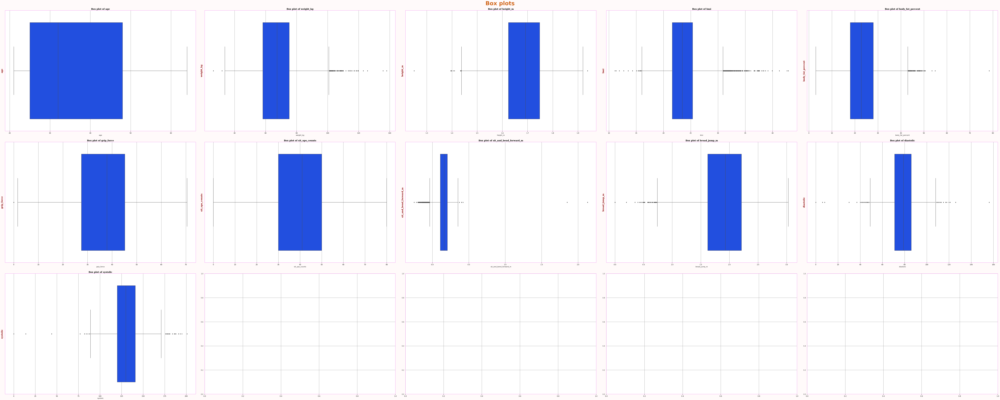

In [98]:
fig,ax = plt.subplots(3,5, figsize=(100,40),constrained_layout=True)
sns.set_theme(style='whitegrid',rc=rc,palette='bright')
ax = ax.ravel()
for index,value in enumerate(num_list):
    sns.boxplot(data=eda,x=value,ax=ax[index])
    ax[index].set_title(f'Box plot of {value}',fontdict=font_title)
    ax[index].set_ylabel(f"{value}", fontdict=font_label)
    fig.suptitle("Box plots",fontdict=font_fig,fontsize=40,fontweight='bold')

In [99]:
for col in num_list:
    outliers(eda,col)

IQR value for column age is: 23.0
Q_1 value for column age is: 25.0, 25% of the data is below 25.0
Q_2 value for column age is: 32.0, 50% of the data is below 32.0
Q_3 value for column age is: 48.0, 75% of the data is below 48.0
Lower bound value for column age is: -9.5
Upper bound value for column age is: 82.5
The number of values within the IQR for age is 7117
The number of outliers beyond the upper bound for age is 0
The number of outliers below the lower bound for age is 0

IQR value for column weight_kg is: 17.1
Q_1 value for column weight_kg is: 58.2, 25% of the data is below 58.2
Q_2 value for column weight_kg is: 67.4, 50% of the data is below 67.4
Q_3 value for column weight_kg is: 75.3, 75% of the data is below 75.3
Lower bound value for column weight_kg is: 32.55000000000001
Upper bound value for column weight_kg is: 100.94999999999999
The number of values within the IQR for weight_kg is 6706
The number of outliers beyond the upper bound for weight_kg is 81
The number of out

In [100]:
corr = eda[num_list].corr()
corr.style.background_gradient()

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic
age,1.000000,-0.100059,-0.294080,0.098646,0.242372,-0.179638,-0.544562,-0.070007,-0.435217,0.158471,0.211082
weight_kg,-0.100059,1.000000,0.734868,0.836636,-0.083958,0.700100,0.295022,-0.296217,0.479546,0.262252,0.338743
height_m,-0.294080,0.734868,1.000000,0.250280,-0.515392,0.735007,0.500551,-0.221933,0.674586,0.145863,0.209963
bmi,0.098646,0.836636,0.250280,1.000000,0.288551,0.415521,0.022778,-0.249436,0.151631,0.261109,0.321011
body_fat_percent,0.242372,-0.083958,-0.515392,0.288551,1.000000,-0.541758,-0.609010,-0.071269,-0.673264,0.048125,-0.030157
grip_force,-0.179638,0.700100,0.735007,0.415521,-0.541758,1.000000,0.576750,-0.112546,0.746846,0.202020,0.285921
sit_ups_counts,-0.544562,0.295022,0.500551,0.022778,-0.609010,0.576750,1.000000,0.177128,0.748334,0.016596,0.056473
sit_and_bend_forward_m,-0.070007,-0.296217,-0.221933,-0.249436,-0.071269,-0.112546,0.177128,1.000000,0.026511,-0.072068,-0.082344
broad_jump_m,-0.435217,0.479546,0.674586,0.151631,-0.673264,0.746846,0.748334,0.026511,1.000000,0.097211,0.152817
diastolic,0.158471,0.262252,0.145863,0.261109,0.048125,0.202020,0.016596,-0.072068,0.097211,1.000000,0.676370


<AxesSubplot:>

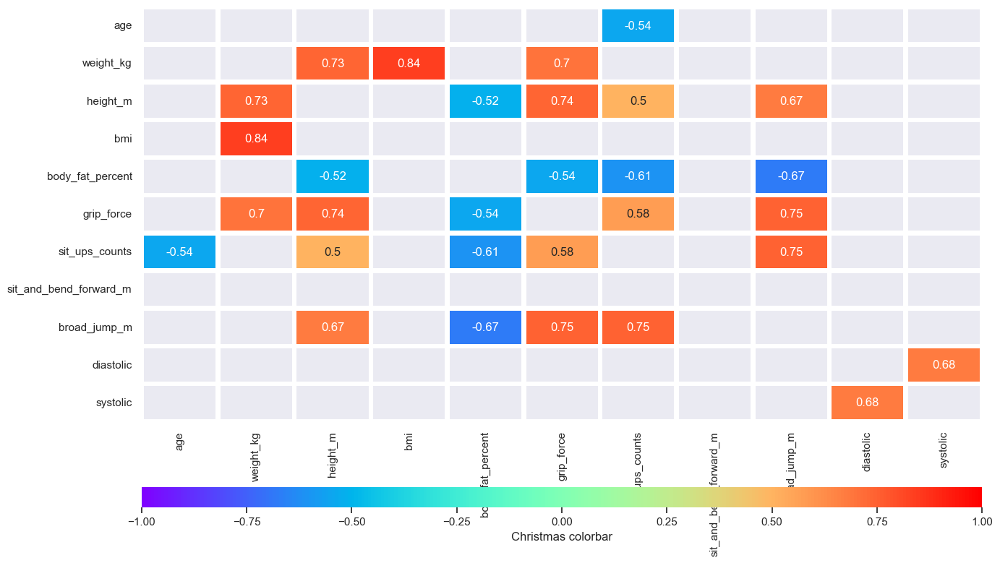

In [101]:
cond = (corr<=-.5) | (corr>=0.5)
# cond = (corr<=-.05) | (corr>=0.5)
filter_corr = corr[(cond)  & (corr!=1)]
sns.set_theme()
grid_kws = {"height_ratios": (1,.05),"hspace":.3}
fig, (ax, cbar_ax) = plt.subplots(2,figsize=(15,9),gridspec_kw=grid_kws)
sns.heatmap(
    filter_corr,
    ax=ax,
    cbar_ax=cbar_ax,
    cmap='rainbow',
    annot=True,
    vmin=-1,
    vmax=1,
    cbar_kws={"orientation":"horizontal",'label':"Christmas colorbar"},
    linewidths=4
)

**Observations**
- age is negatively correlatd to sit_ups_counts.
- weight is positively correlated to height, bmi and grip_force.
- height is positively correlated to sit_ups_counts and broad_jump, but negatively correlated to body_fat_percentage
- body_fat_percentage is negatively correlated to grip_force, sit_ups_count and broad_jump
- grip_force is positively correlated with sit_ups_count and broad_jump
- sit_ups_count is positively correlated with broad_jump
- diastolic and systolic is are positively correlated with each other.

In [102]:
def line_plots(x:str,y:str):
    try:
        sns.set_theme(style='darkgrid',palette='husl',rc=rc)
        fig,ax = plt.subplots(figsize=(20,10))
        sns.lineplot(data=eda,x=x,y=y) #,hue='gender')
        ax.set_title(f'Line plot of {x} vs {y}',fontsize=14)
    except ValueError:
        print(f"The wrong Key was passed\nPlease look are the information below\n")
        eda.info(memory_usage='deep')

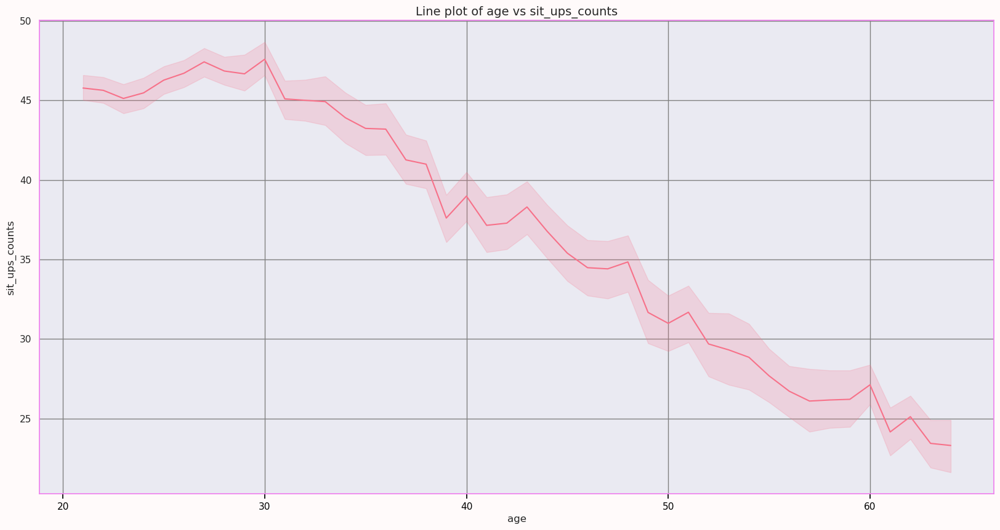

In [103]:
line_plots('age','sit_ups_counts')

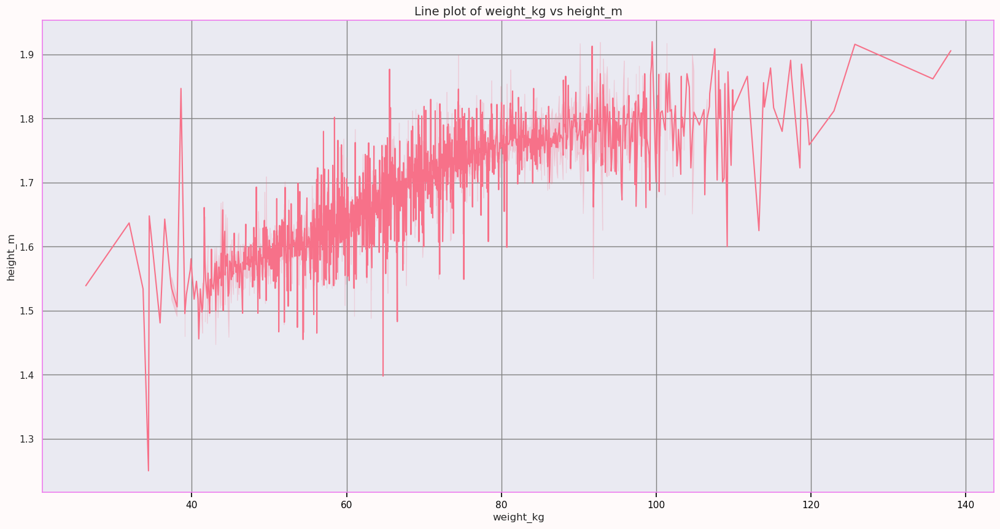

In [104]:
line_plots('weight_kg','height_m')

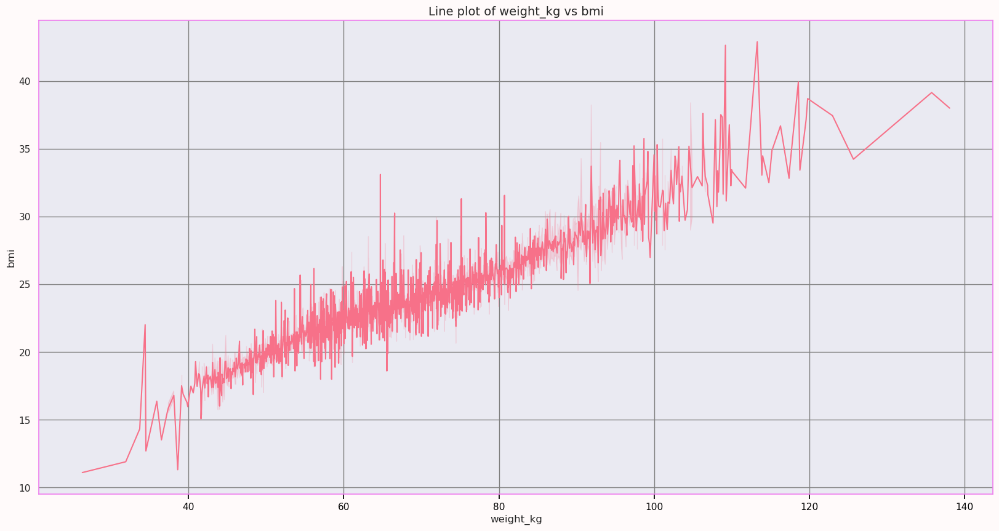

In [105]:
line_plots('weight_kg','bmi')

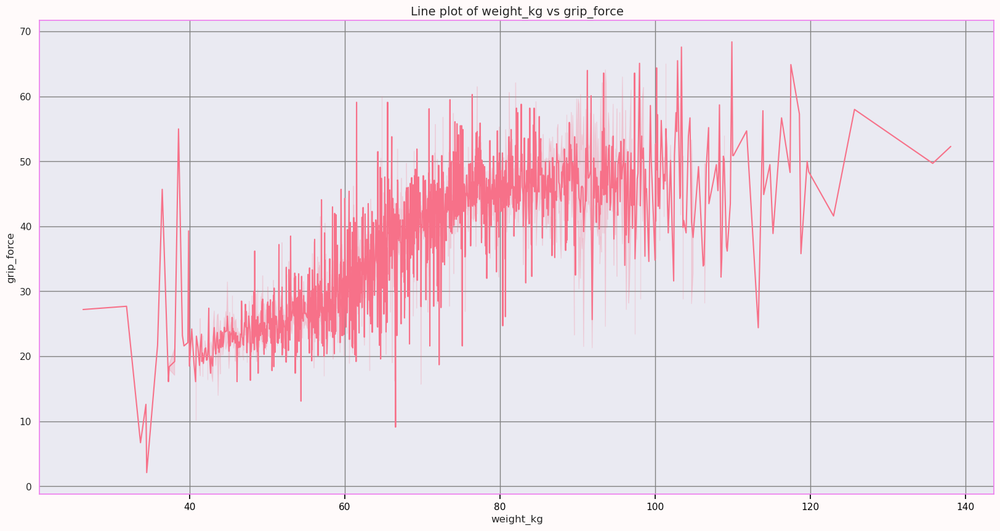

In [106]:
line_plots('weight_kg','grip_force')

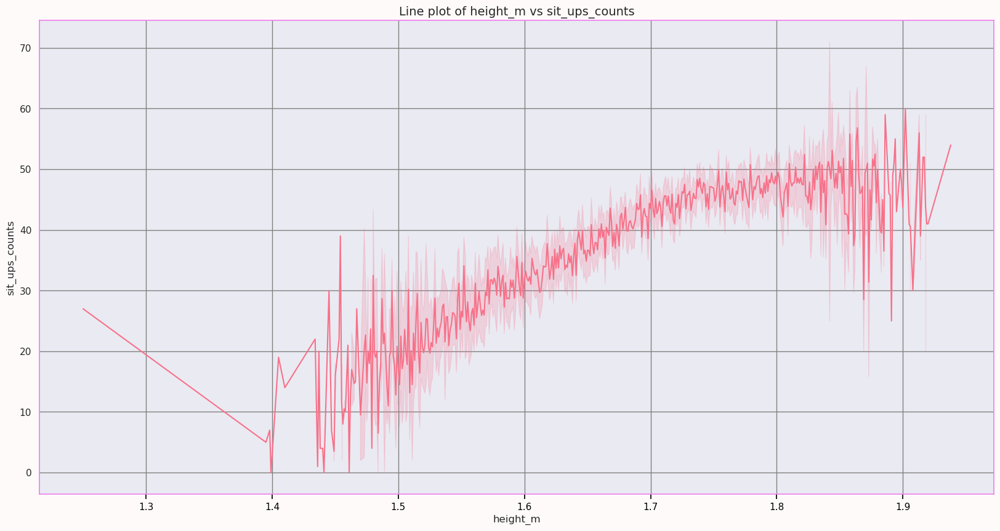

In [107]:
line_plots('height_m','sit_ups_counts')

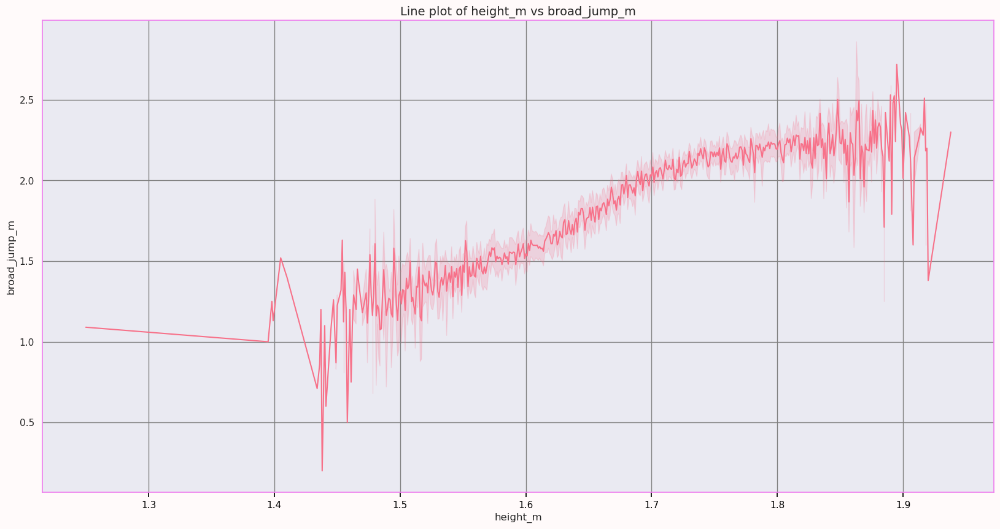

In [108]:
line_plots('height_m','broad_jump_m')

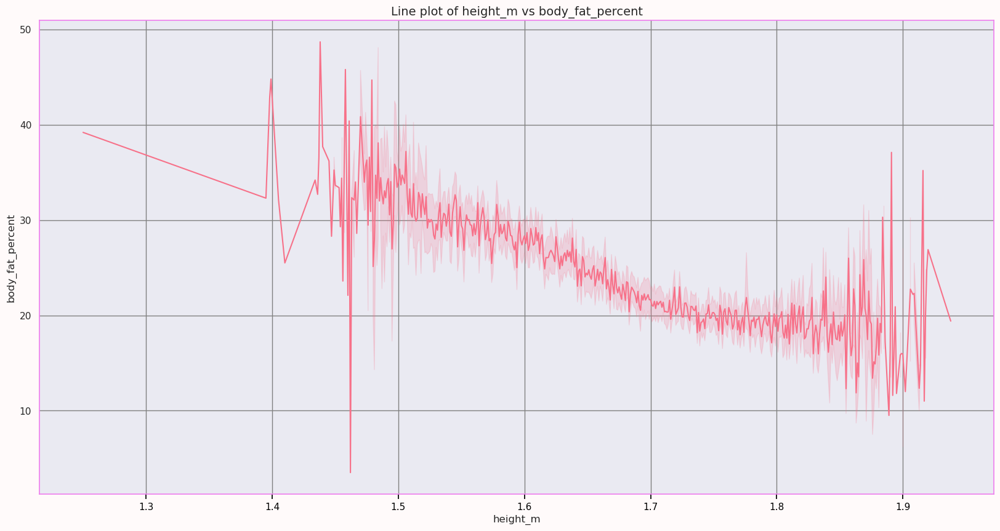

In [109]:
line_plots('height_m','body_fat_percent')

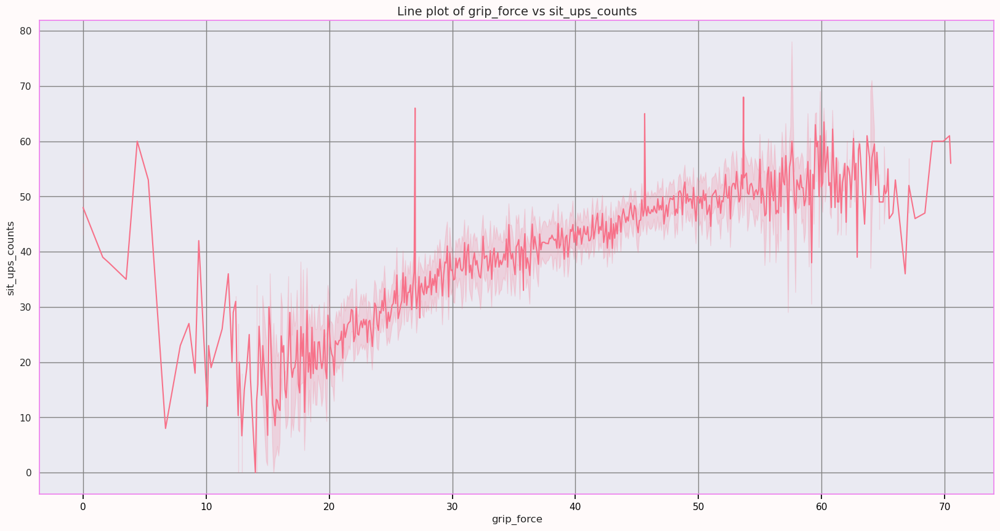

In [110]:
line_plots('grip_force','sit_ups_counts')

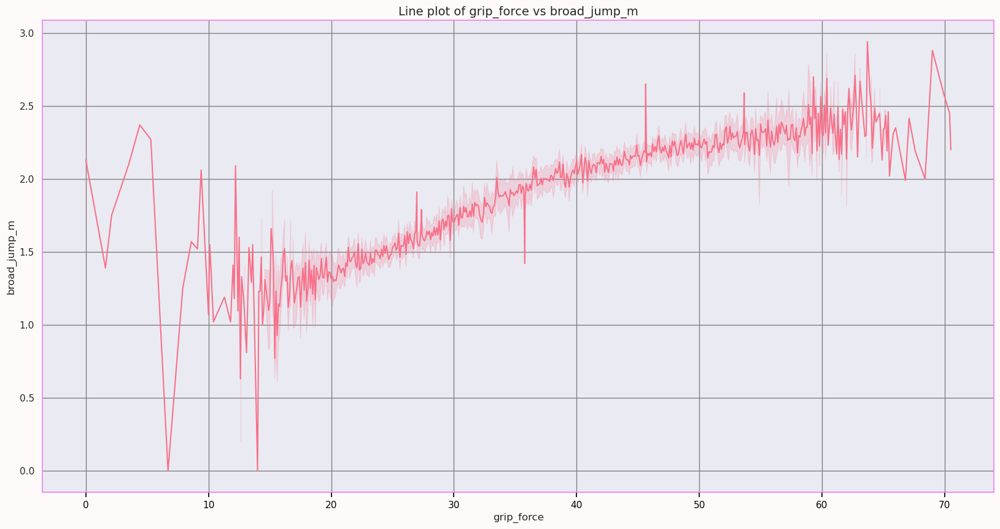

In [111]:
line_plots('grip_force','broad_jump_m')

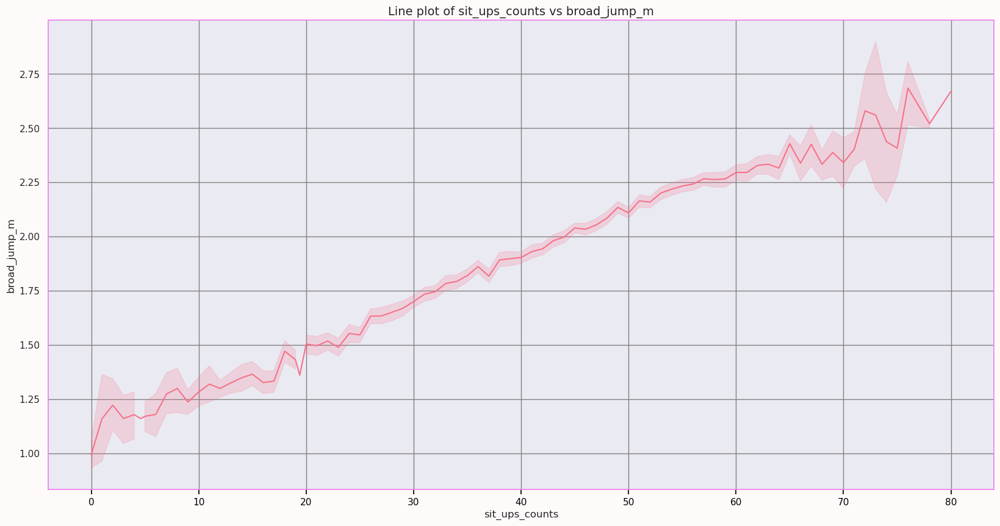

In [112]:
line_plots('sit_ups_counts','broad_jump_m')

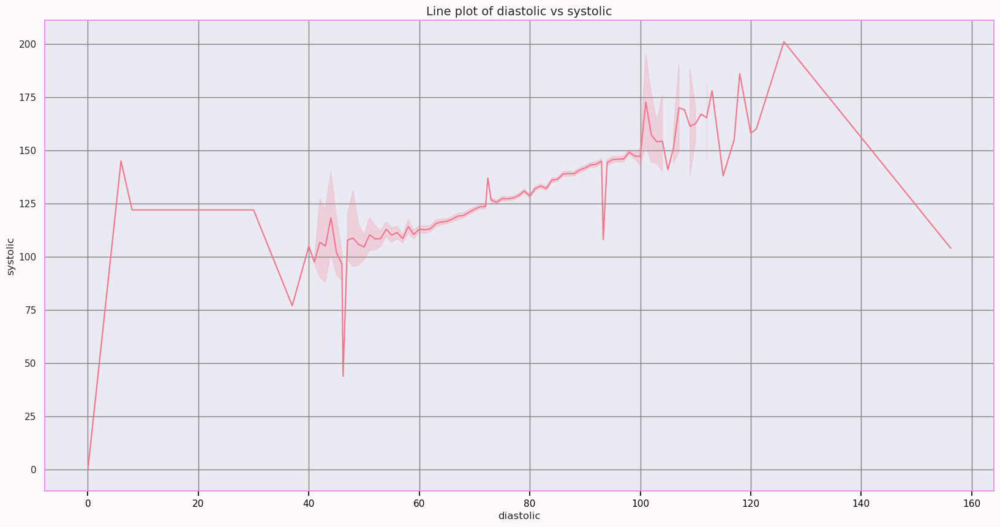

In [113]:
line_plots('diastolic','systolic')

These plots confirms the heatmap plot

In [114]:
def scatter_plots(x:str,y:str):
    try:
        sns.set_theme(style='darkgrid',palette='bright',rc=rc)
        fig,ax = plt.subplots(figsize=(20,10))
        sns.scatterplot(data=eda,x=x,y=y) #,hue='gender')
        ax.set_title(f'Line plot of {x} vs {y}',fontsize=14)
    except ValueError:
        print(f"The wrong Key was passed\nPlease look are the information below\n")
        eda.info(memory_usage='deep')

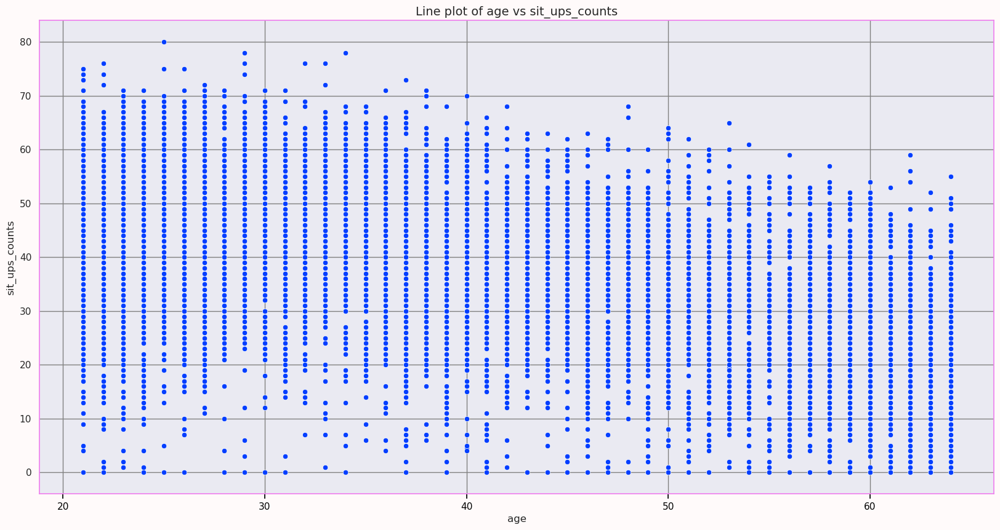

In [115]:
scatter_plots('age','sit_ups_counts')

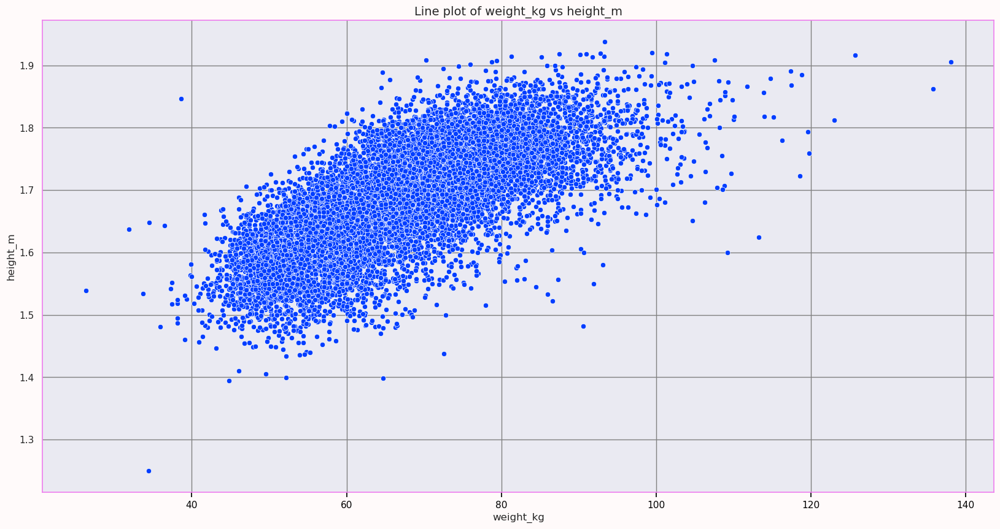

In [116]:
scatter_plots('weight_kg','height_m')

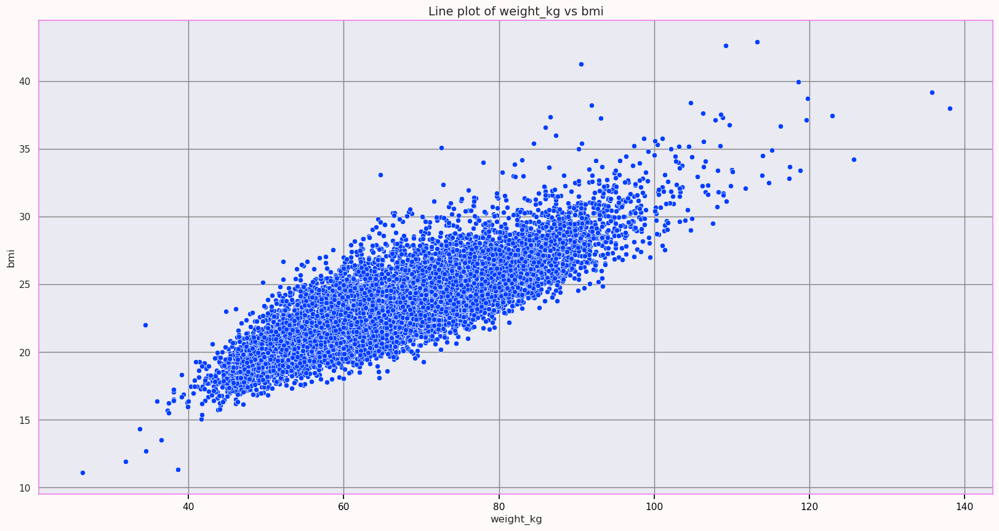

In [117]:
scatter_plots('weight_kg','bmi')

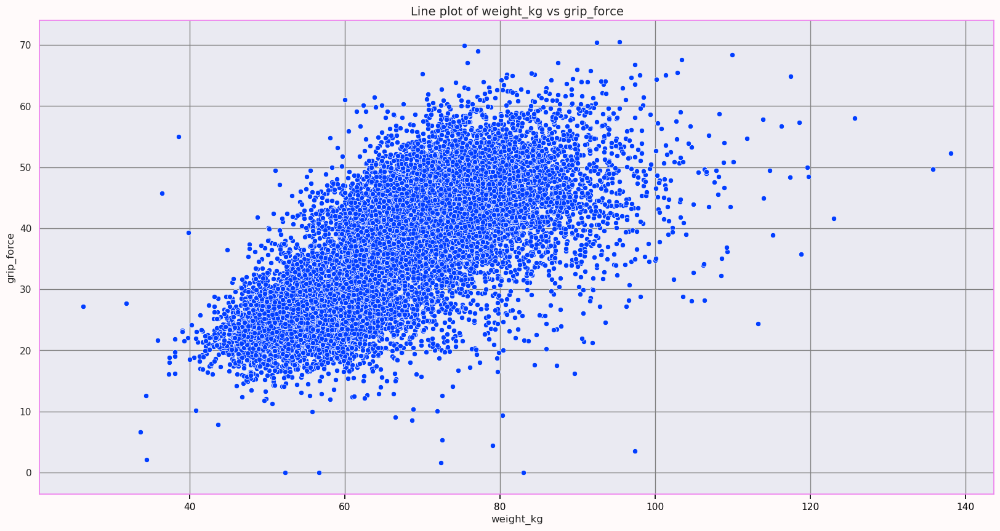

In [118]:
scatter_plots('weight_kg','grip_force')

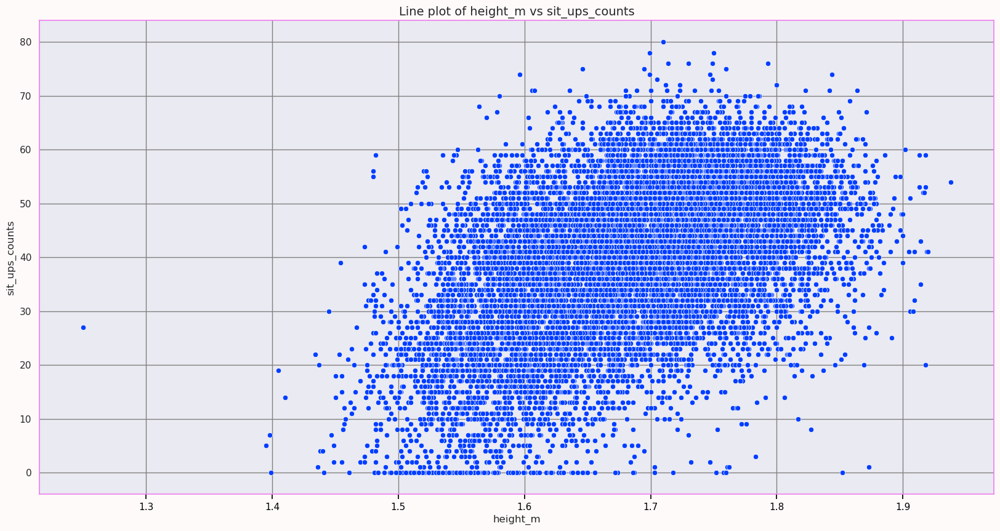

In [119]:
scatter_plots('height_m','sit_ups_counts')

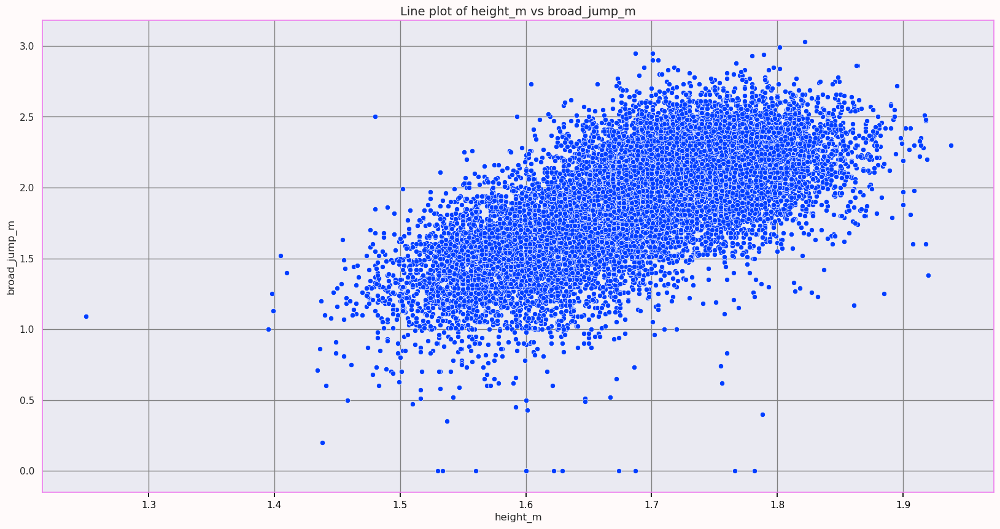

In [120]:
scatter_plots('height_m','broad_jump_m')

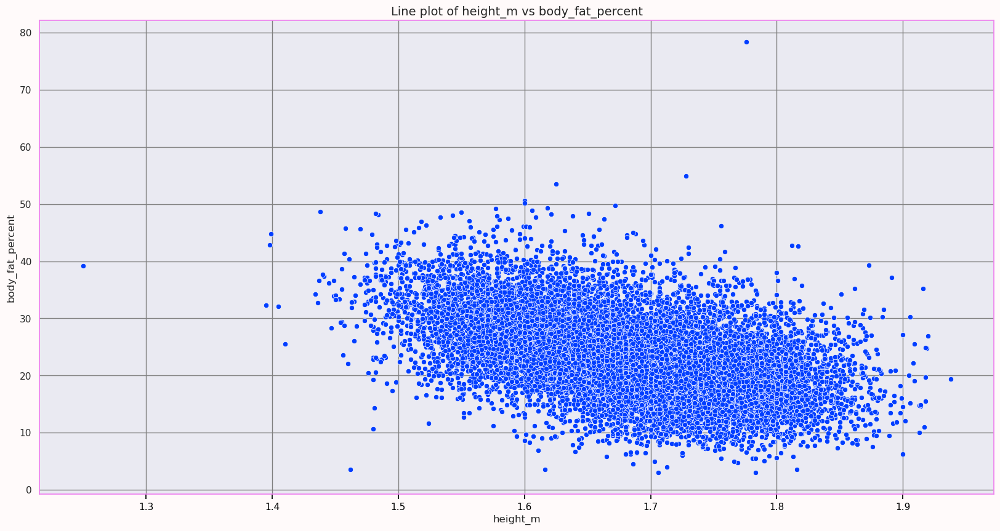

In [121]:
scatter_plots('height_m','body_fat_percent')

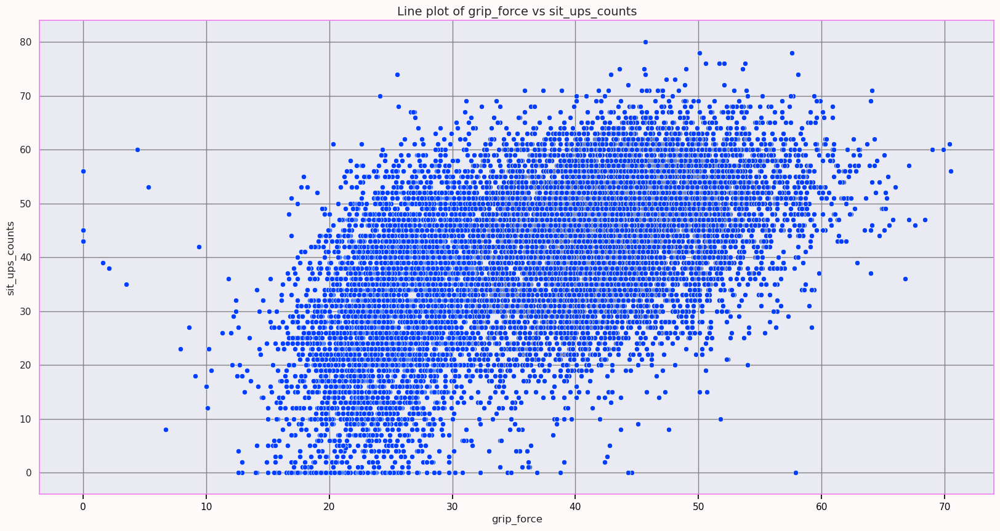

In [122]:
scatter_plots('grip_force','sit_ups_counts')

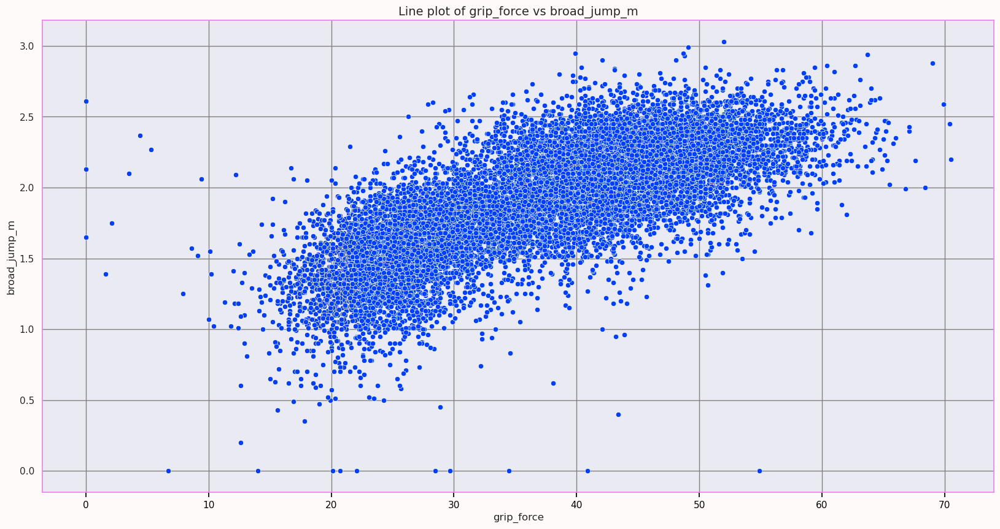

In [123]:
scatter_plots('grip_force','broad_jump_m')

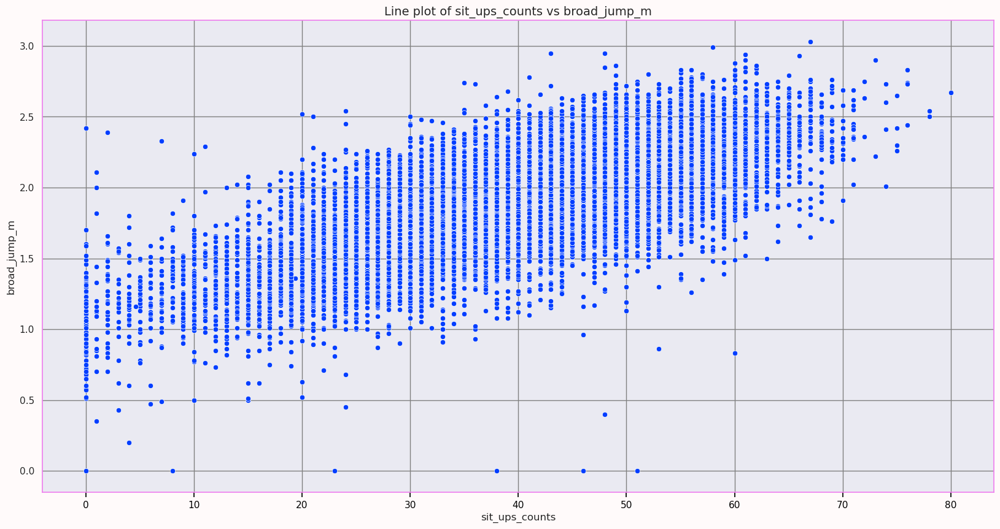

In [124]:
scatter_plots('sit_ups_counts','broad_jump_m')

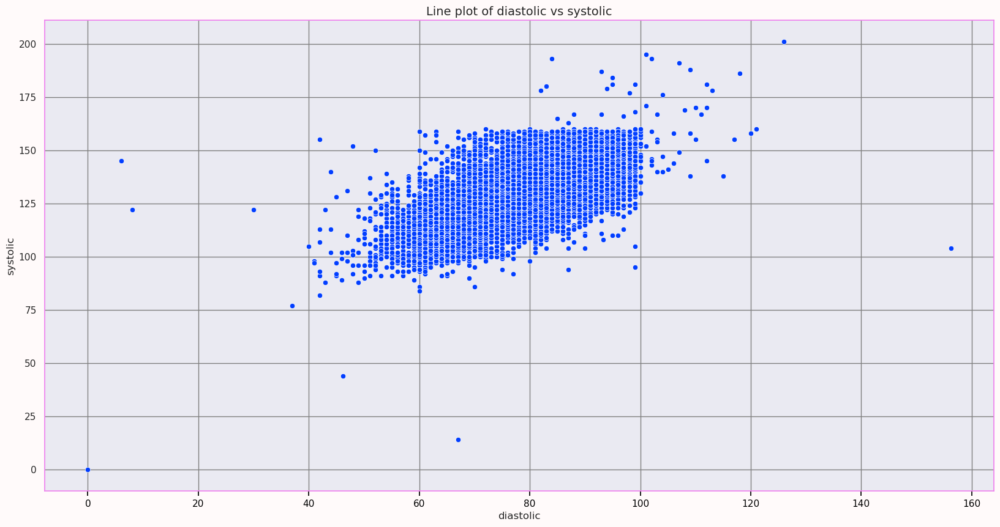

In [125]:
scatter_plots('diastolic','systolic')

These plots confirms the heatmap plot and line plots.

In [126]:
eda.columns

Index(['age', 'weight_kg', 'height_m', 'bmi', 'body_fat_percent', 'grip_force',
       'sit_ups_counts', 'sit_and_bend_forward_m', 'broad_jump_m', 'diastolic',
       'systolic', 'gender', 'encoded_class', 'age_log', 'bmi_log',
       'sit_and_bend_forward_m_log'],
      dtype='object')

In [130]:
# export = eda.drop(columns=['bmi',"age"])
export = eda.copy()
reoder =[
'age', 
'weight_kg', 
'height_m', 
'bmi', 
'body_fat_percent',
'grip_force',
'sit_ups_counts',
'sit_and_bend_forward_m',
'broad_jump_m', 'diastolic',
'systolic', 
'gender', 
'encoded_class', 
]
export = export[reoder]

In [131]:
export.sample(random_state=42,n=5)

,age,weight_kg,height_m,bmi,body_fat_percent,grip_force,sit_ups_counts,sit_and_bend_forward_m,broad_jump_m,diastolic,systolic,gender,encoded_class
10773,21,71.50,1.751,23.320279,21.1,33.0,26.0,0.103,1.82,94.0,138.0,1,3
5496,42,67.30,1.623,25.549242,18.0,48.5,52.0,0.152,2.19,64.0,130.0,1,0
13055,36,90.50,1.785,28.403518,14.7,64.0,45.0,0.264,2.62,87.0,125.0,1,2
11825,29,85.50,1.823,25.727215,17.7,49.5,43.0,0.122,2.54,76.0,122.0,1,3
1326,53,88.48,1.773,28.146710,35.6,36.3,18.0,0.064,1.83,76.0,130.0,1,3


In [132]:
export.to_csv("classify/classification_dataset.csv",index=False)